In [1]:
import os
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
import math
from torch import nn, Tensor, TupleType

from torch.nn import Transformer
from torch.nn import Transformer_1dcnn





from torch.utils.data import TensorDataset, DataLoader, Dataset, random_split
from torch.autograd import Variable
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split  

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
print(device)

cuda:0


In [55]:
mm_scaler = MinMaxScaler()

class StrideDataset(Dataset):
    def __init__(self, file_path, enc_seq_len, target_seq_len, x_size, stride=5):
        df = pd.read_csv(file_path)
        
        self.soc = df.iloc[x_size:, 20:21].values #SoC
        self.soc = self.soc.squeeze()
        self.soc = mm_scaler.fit_transform(self.soc.reshape(-1, 1))
        self.soc = self.soc.squeeze()

        self.src_v = df.iloc[x_size:, 7:8].values #V
        self.src_v = self.src_v.squeeze()
        self.src_v = mm_scaler.fit_transform(self.src_v.reshape(-1, 1))
        self.src_v = self.src_v.squeeze()

        self.src_c = df.iloc[x_size:, 6:7].values #I
        self.src_c = self.src_c.squeeze()
        self.src_c = mm_scaler.fit_transform(self.src_c.reshape(-1, 1))
        self.src_c = self.src_c.squeeze()


        self.length = len(df) - x_size

        num_samples = (self.length - enc_seq_len - target_seq_len) // stride + 1 #stride씩 움직일 때 생기는 총 sample 개수
        
        src_v = np.zeros([enc_seq_len, num_samples])
        src_c = np.zeros([enc_seq_len, num_samples])
        trg = np.zeros([target_seq_len, num_samples])

        
        for i in np.arange(num_samples):
            start_x = stride*i
            end_x = start_x + enc_seq_len
            src_v[:,i] = self.src_v[start_x:end_x]
            src_c[:,i] = self.src_c[start_x:end_x]

            start_y = stride*i + enc_seq_len
            end_y = start_y + target_seq_len
            trg[:,i] = self.soc[start_y:end_y]

        src_v = src_v.reshape(src_v.shape[0], src_v.shape[1], 1).transpose((1,0,2))
        src_c = src_c.reshape(src_c.shape[0], src_c.shape[1], 1).transpose((1,0,2))
        trg = trg.reshape(trg.shape[0], trg.shape[1], 1).transpose((1,0,2))

        print(src_v.shape)
        self.src_v = src_v
        print(src_c.shape)
        self.src_c = src_c
        self.trg = trg

        self.len = len(src_v)

    def __getitem__(self, i):
        return self.src_v[i], self.src_c[i], self.trg[i, :-1], self.trg[i, 1:]
    
    def __len__(self):
        return self.len

In [56]:
train_dataset_1 = StrideDataset("DST_80.csv", 50, 20, 1919, stride=5)

(2114, 50, 1)
(2114, 50, 1)


In [3]:
flag = np.zeros(19)
flag_soc = flag + 0.5
flag

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0.])

In [19]:
class StrideDataset_e(Dataset):
    def __init__(self, file_path, enc_seq_len, target_seq_len, x_size, stride=5):
        df = pd.read_csv(file_path)
        
        self.soc = df.iloc[x_size:, 20:21].values #SoC
        self.soc = self.soc.squeeze()
        self.soc = mm_scaler.fit_transform(self.soc.reshape(-1, 1))
        self.soc = self.soc.squeeze()
        self.soc = np.concatenate((flag_soc, self.soc))
        plt.plot(self.soc)

        self.src_v = df.iloc[x_size:, 7:8].values #V
        self.src_v = self.src_v.squeeze()
        self.src_v = mm_scaler.fit_transform(self.src_v.reshape(-1, 1))
        self.src_v = self.src_v.squeeze()
        self.src_v = np.concatenate((self.src_v, flag))
        

        self.src_c = df.iloc[x_size:, 6:7].values #I
        self.src_c = self.src_c.squeeze()
        self.src_c = mm_scaler.fit_transform(self.src_c.reshape(-1, 1))
        self.src_c = self.src_c.squeeze()
        self.src_c = np.concatenate((self.src_c, flag))


        self.length = len(df) - x_size + 19

        num_samples = (self.length - enc_seq_len - target_seq_len) // stride + 1 #stride씩 움직일 때 생기는 총 sample 개수
        
        src_v = np.zeros([enc_seq_len, num_samples])
        src_c = np.zeros([enc_seq_len, num_samples])
        trg = np.zeros([target_seq_len, num_samples])


        for i in np.arange(num_samples):
            start_x = stride*i
            end_x = start_x + enc_seq_len
            src_v[:,i] = self.src_v[start_x:end_x]
            src_c[:,i] = self.src_c[start_x:end_x]

            start_y = stride*i + enc_seq_len
            end_y = start_y + target_seq_len
            trg[:,i] = self.soc[start_y:end_y]

        src_v = src_v.reshape(src_v.shape[0], src_v.shape[1], 1).transpose((1,0,2))
        src_c = src_c.reshape(src_c.shape[0], src_c.shape[1], 1).transpose((1,0,2))
        trg = trg.reshape(trg.shape[0], trg.shape[1], 1).transpose((1,0,2))
        print(src_v.shape)
        
        # trg = np.concatenate((flag,trg), 1)
        # print(trg.shape)

        self.src_v = src_v
        self.src_c = src_c
        self.trg = trg
        
        

        self.len = len(src_v)

    def __getitem__(self, i):
        return self.src_v[i], self.src_c[i], self.trg[i, :-1], self.trg[i, 1:]
    
    def __len__(self):
        return self.len

(2209, 50, 1)


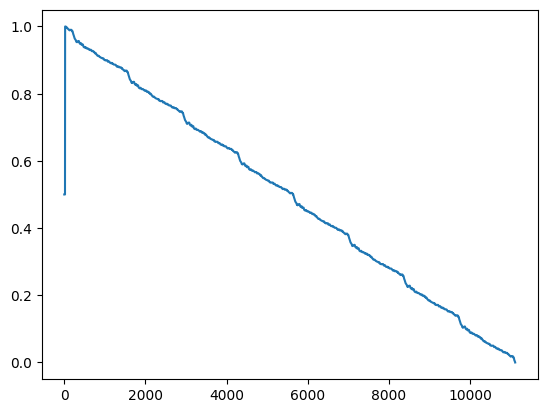

In [20]:
train_dataset_1 = StrideDataset_e("FUDS_80.csv", 50, 20, 2586, stride=5)


In [6]:
# class StrideDataset_2(Dataset):
#     def __init__(self, file_path, enc_seq_len, target_seq_len, x_size, stride=5):
#         df = pd.read_csv(file_path)
        
#         self.data = df.iloc[x_size:, 13:14].values #SoC
#         self.data = self.data.squeeze()

#         self.length = len(df) - x_size

#         num_samples = (self.length - enc_seq_len - target_seq_len) // stride + 1 #stride씩 움직일 때 생기는 총 sample 개수
        
#         src = np.zeros([enc_seq_len, num_samples])
#         trg = np.zeros([target_seq_len, num_samples])


#         for i in np.arange(num_samples):
#             start_x = stride*i
#             end_x = start_x + enc_seq_len
#             src[:,i] = self.data[start_x:end_x]

#             start_y = stride*i + enc_seq_len
#             end_y = start_y + target_seq_len
#             trg[:,i] = self.data[start_y:end_y]

#         src = src.reshape(src.shape[0], src.shape[1], 1).transpose((1,0,2))
#         trg = trg.reshape(trg.shape[0], trg.shape[1], 1).transpose((1,0,2))
#         self.src = src
#         self.trg = trg

#         self.len = len(src)

#     def __getitem__(self, i):
#         return self.src[i], self.trg[i, :-1], self.trg[i, 1:]
    
#     def __len__(self):
#         return self.len

In [7]:
flag_y = np.zeros(51)

In [8]:
class CustomDataset(Dataset):
    def __init__(self, file_path, x_size):
        df = pd.read_csv(file_path)
        #print(df.isnull().sum())

        self.x = df.iloc[x_size:, 6:10].values
        #self.x = np.reshape(x, (x.shape[0], 1, x.shape[1]))
        self.y = df.iloc[x_size:, 20:21].values
        
        self.length = len(df) - x_size

    def __getitem__(self, index):
        # x = torch.FloatTensor([self.x[index]])
        # y = torch.FloatTensor([self.y[index]])
        # return x, y
        feature = torch.FloatTensor([self.x[index]])
        label = torch.FloatTensor(self.y[index])

        return feature, label

    def __len__(self):
        return self.length

In [9]:
dataset_d = CustomDataset("DST_80.csv", 1919)


In [10]:
train_dataset_1 = StrideDataset("DST_80.csv", 50, 20, 1919, stride=5)
train_dataset_2 = StrideDataset("US06_80.csv", 50, 20, 1207, stride=5)
# train_dataset_1 = StrideDataset("FUDS_80.csv", 50, 20, 2586, stride=5)
# train_dataset_2 = StrideDataset("BJDST_80.csv", 50, 20, 1226, stride=5)

train_dataset = torch.utils.data.ConcatDataset([train_dataset_1, train_dataset_2])
# train_dataset = train_dataset_2


train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True, drop_last=False)
# dataset_d = CustomDataset("DST_80.csv", 1919)

In [11]:
# plt.plot(train_dataset_1)
# plt.show()
# plt.plot(train_dataset.src_v.squeeze())
# plt.show()
# plt.plot(train_dataset.trg.squeeze())
# plt.show()


In [12]:
class TFModel(nn.Module):
    def __init__(self, d_model, nhead, nhid, nlayers, dropout=0.5):
        super(TFModel, self).__init__()

        # self.transformer = Transformer(d_model=d_model, nhead=nhead, dim_feedforward=nhid, num_encoder_layers=nlayers, num_decoder_layers=nlayers,dropout=dropout)
        
        # self.linear = nn.Linear(d_model, 1)
        # self.pos_encoder = PositionalEncoding(d_model, dropout)

        # self.encoder = nn.Linear(1, d_model)

        self.coder_in = nn.Linear(1,d_model)
        
        self.conv_in = nn.Sequential(
            nn.Conv1d(1, 500, kernel_size=15),
            nn.Softmax(dim=1),
            nn.Linear(50-15+1, 50) #src-ker+1, src
        )
        
        self.conv_in_dec = nn.Sequential(
            nn.Conv1d(1,500,kernel_size=15),
            nn.Softmax(dim=1),
            nn.Linear(20-15, 20-1) #dec-ker, dec-1
        )
        
        
        self.conv_out = nn.Sequential(
            nn.Conv1d(500,50,kernel_size=5,stride=3),
            #nn.ReLU(),
            nn.Conv1d(50,1,kernel_size=3,stride=1),
            #nn.ReLU(),
            nn.Linear(3,30),
            #nn.ReLU(),
            nn.Linear(30,19)
        )

        self.coder_pos = PositionalEncoding(d_model, dropout)

        self.encoder_layer = nn.TransformerEncoderLayer(d_model=d_model, nhead=nhead, dropout=dropout)
        self.transformer_encoder = nn.TransformerEncoder(self.encoder_layer, num_layers=nlayers)
        
        #
        self.encoder_layer_1dcnn = nn.TransformerEncoderLayer_1dcnn(d_model=d_model, nhead=nhead, dropout=dropout)
        self.transformer_encoder_1dcnn = nn.TransformerEncoder_1dcnn(self.encoder_layer_1dcnn, num_layers=nlayers)
        #


        self.con_lin = nn.Linear(d_model*2, d_model)

        self.decoder_layer = nn.TransformerDecoderLayer(d_model=d_model, nhead=nhead, dropout=dropout)
        self.transformer_decoder = nn.TransformerDecoder(self.decoder_layer, num_layers=nlayers) #(target, memory) // memort->인코더에서 나온 컨텍스트벡터?
        #
        self.decoder_layer_1dcnn = nn.TransformerDecoderLayer_1dcnn(d_model=d_model, nhead=nhead, dropout=dropout)
        self.transformer_decoder_1dcnn = nn.TransformerDecoder_1dcnn(self.decoder_layer_1dcnn, num_layers=nlayers)
        #
        
        
        
        
        self.linear = nn.Sequential(
            nn.Linear(d_model, 1)
        )
        self.linear_in = nn.Linear(1, d_model)
        

    def generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    #def forward(self, src, tgt, srcmask, tgtmask):
    def forward(self, src_v, src_c, tgt_s, src_mask_v, src_mask_c, tgtmask):
        # src_v = self.coder_in(src_v)
        src_v = self.conv_in(src_v.transpose(2,1)).transpose(2,1)
        src_v = self.coder_pos(src_v)

        # src_c = self.coder_in(src_c)
        src_c = self.conv_in(src_c.transpose(2,1)).transpose(2,1)
        src_c = self.coder_pos(src_c)

        # print(src_v.shape)
        con_v = self.transformer_encoder(src_v.transpose(0,1), src_mask_v).transpose(0,1)  #-> 그냥
        # con_v = self.transformer_encoder_1dcnn(src_v.transpose(0,1), src_mask_v) #-> 인코더 ff 1dcnn
        # print(con_v.shape)
        con_c = self.transformer_encoder(src_c.transpose(0,1), src_mask_c).transpose(0,1)
        # con_c = self.transformer_encoder_1dcnn(src_c.transpose(0,1), src_mask_c)
        
        #print(con_v.shape)
        #print(con_c.shape)
        

        con = torch.cat((con_v, con_c), dim=2)
        #print(con.shape)
        
        con = self.con_lin(con)
        #print(con.shape)
        
        
        #print(tgt_s.shape)
        tgt_s = self.coder_in(tgt_s)
        # tgt_s = self.conv_in_dec(tgt_s.transpose(2,1)).transpose(2,1)
        tgt_s = self.coder_pos(tgt_s)
        
        
        tgt = self.transformer_decoder(tgt_s.transpose(0,1), con.transpose(0,1)).transpose(0,1)
        # tgt = self.transformer_decoder_1dcnn(tgt_s.transpose(0,1), con.transpose(0,1)).transpose(0,1)
        # print(tgt.shape)
        tgt = self.linear(tgt)
        # tgt = self.conv_out(tgt.transpose(2,1)).transpose(2,1)
        # print(tgt.shape)

        return tgt

class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

def gen_attention_mask(x):
    mask = torch.eq(x, 0)
    return mask

In [13]:
lr = 0.00003
model = TFModel(500, 10, 256, 4, 0.1).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

In [14]:
epoch = 2500
model.train()
progress = tqdm(range(epoch))

loss_arr = list()


for i in progress:
    batchloss = 0.0
    for (inputs_v, inputs_c, dec_inputs, outputs) in train_dataloader:
        optimizer.zero_grad()
        #print(inputs_v.shape[1])
        src_mask_v = model.generate_square_subsequent_mask(inputs_v.shape[1]).to(device)
        src_mask_c = model.generate_square_subsequent_mask(inputs_c.shape[1]).to(device)
        #print(dec_inputs.shape[1])
        tgt_mask = model.generate_square_subsequent_mask(dec_inputs.shape[1]).to(device)
        
        result = model(inputs_v.float().to(device), inputs_c.float().to(device), dec_inputs.float().to(device), src_mask_v, src_mask_c, tgt_mask)
        
        #loss = criterion(result.permute(1,0,2), outputs.float().to(device))
        loss = criterion(result, outputs.float().to(device))
        
        
        loss.backward()
        optimizer.step()
        batchloss += loss
    
        
    loss_arr.append((batchloss.cpu().item() / len(train_dataloader)))
    progress.set_description("loss: {:0.6f}".format(batchloss.cpu().item() / len(train_dataloader)))




    # for i in progress:
    # batchloss = 0.0

    # for (inputs, tgt, tgt_y) in train_dataloader:
    #     optimizer.zero_grad()

    #     result = model(src.float().to(device), tgt.float().to(device), src_mask, tgt_mask)
    #     loss = loss_func(result, tgt_y.float().to(device))

    #     loss.backward()
    #     optimizer.step()
    #     batchloss += loss
    
    # progress.set_description("{:0.5f}".format(batchloss.cpu().item() / len(train_dataloader)))#??

  0%|          | 0/2500 [00:00<?, ?it/s]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.316685:   0%|          | 1/2500 [00:06<4:21:13,  6.27s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.292760:   0%|          | 2/2500 [00:10<3:20:07,  4.81s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.285434:   0%|          | 3/2500 [00:13<3:00:45,  4.34s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.276756:   0%|          | 4/2500 [00:17<2:51:30,  4.12s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.267986:   0%|          | 5/2500 [00:21<2:46:14,  4.00s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.259030:   0%|          | 6/2500 [00:25<2:43:22,  3.93s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.250692:   0%|          | 7/2500 [00:28<2:41:22,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.240393:   0%|          | 8/2500 [00:32<2:40:12,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.230053:   0%|          | 9/2500 [00:36<2:39:23,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.221257:   0%|          | 10/2500 [00:40<2:39:22,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.210204:   0%|          | 11/2500 [00:44<2:38:24,  3.82s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.200620:   0%|          | 12/2500 [00:47<2:37:44,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.190183:   1%|          | 13/2500 [00:51<2:37:24,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.180157:   1%|          | 14/2500 [00:55<2:37:07,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.169722:   1%|          | 15/2500 [00:59<2:36:44,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.159531:   1%|          | 16/2500 [01:03<2:36:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.150365:   1%|          | 17/2500 [01:06<2:36:41,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.140402:   1%|          | 18/2500 [01:10<2:36:34,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.131572:   1%|          | 19/2500 [01:14<2:36:36,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.122435:   1%|          | 20/2500 [01:18<2:36:40,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.114624:   1%|          | 21/2500 [01:22<2:37:09,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.106208:   1%|          | 22/2500 [01:25<2:37:40,  3.82s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.098511:   1%|          | 23/2500 [01:29<2:38:12,  3.83s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.091419:   1%|          | 24/2500 [01:33<2:38:27,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.084748:   1%|          | 25/2500 [01:37<2:38:25,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.078493:   1%|          | 26/2500 [01:41<2:38:30,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.072232:   1%|          | 27/2500 [01:45<2:38:40,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.066634:   1%|          | 28/2500 [01:49<2:38:43,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.061332:   1%|          | 29/2500 [01:52<2:38:43,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.055984:   1%|          | 30/2500 [01:56<2:38:51,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.051341:   1%|          | 31/2500 [02:00<2:38:38,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.047143:   1%|▏         | 32/2500 [02:04<2:38:43,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.042971:   1%|▏         | 33/2500 [02:08<2:38:40,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.039085:   1%|▏         | 34/2500 [02:12<2:38:39,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.035644:   1%|▏         | 35/2500 [02:16<2:38:36,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.032447:   1%|▏         | 36/2500 [02:19<2:38:27,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.029423:   1%|▏         | 37/2500 [02:23<2:38:37,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.026822:   2%|▏         | 38/2500 [02:27<2:38:35,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.024488:   2%|▏         | 39/2500 [02:31<2:38:35,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.022280:   2%|▏         | 40/2500 [02:35<2:38:40,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.020335:   2%|▏         | 41/2500 [02:39<2:38:27,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.018656:   2%|▏         | 42/2500 [02:43<2:38:18,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.017155:   2%|▏         | 43/2500 [02:47<2:38:25,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.015791:   2%|▏         | 44/2500 [02:50<2:38:10,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.014657:   2%|▏         | 45/2500 [02:54<2:38:12,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.013604:   2%|▏         | 46/2500 [02:58<2:38:10,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.012713:   2%|▏         | 47/2500 [03:02<2:38:10,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.011882:   2%|▏         | 48/2500 [03:06<2:38:12,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.011209:   2%|▏         | 49/2500 [03:10<2:38:01,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.010671:   2%|▏         | 50/2500 [03:14<2:37:56,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.010126:   2%|▏         | 51/2500 [03:17<2:37:48,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.009719:   2%|▏         | 52/2500 [03:21<2:37:51,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.009380:   2%|▏         | 53/2500 [03:25<2:37:51,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.009036:   2%|▏         | 54/2500 [03:29<2:37:46,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.008731:   2%|▏         | 55/2500 [03:33<2:37:52,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.008457:   2%|▏         | 56/2500 [03:37<2:37:40,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.008235:   2%|▏         | 57/2500 [03:41<2:37:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.008023:   2%|▏         | 58/2500 [03:45<2:37:31,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007818:   2%|▏         | 59/2500 [03:48<2:37:25,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007638:   2%|▏         | 60/2500 [03:52<2:37:27,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007519:   2%|▏         | 61/2500 [03:56<2:37:18,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007366:   2%|▏         | 62/2500 [04:00<2:37:04,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007234:   3%|▎         | 63/2500 [04:04<2:37:12,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007127:   3%|▎         | 64/2500 [04:08<2:37:00,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.007028:   3%|▎         | 65/2500 [04:12<2:37:03,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006899:   3%|▎         | 66/2500 [04:16<2:37:02,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006777:   3%|▎         | 67/2500 [04:19<2:37:09,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006703:   3%|▎         | 68/2500 [04:23<2:37:10,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006590:   3%|▎         | 69/2500 [04:27<2:37:08,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006474:   3%|▎         | 70/2500 [04:31<2:37:07,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006398:   3%|▎         | 71/2500 [04:35<2:36:57,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006304:   3%|▎         | 72/2500 [04:39<2:36:46,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006214:   3%|▎         | 73/2500 [04:43<2:36:48,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006150:   3%|▎         | 74/2500 [04:47<2:36:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.006025:   3%|▎         | 75/2500 [04:50<2:36:38,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005974:   3%|▎         | 76/2500 [04:54<2:36:41,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005867:   3%|▎         | 77/2500 [04:58<2:36:34,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005761:   3%|▎         | 78/2500 [05:02<2:36:36,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005718:   3%|▎         | 79/2500 [05:06<2:36:30,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005603:   3%|▎         | 80/2500 [05:10<2:36:17,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005572:   3%|▎         | 81/2500 [05:14<2:36:16,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005471:   3%|▎         | 82/2500 [05:18<2:36:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005374:   3%|▎         | 83/2500 [05:21<2:36:09,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005323:   3%|▎         | 84/2500 [05:25<2:36:06,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005261:   3%|▎         | 85/2500 [05:29<2:35:52,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005147:   3%|▎         | 86/2500 [05:33<2:36:00,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005095:   3%|▎         | 87/2500 [05:37<2:35:55,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.005006:   4%|▎         | 88/2500 [05:41<2:35:46,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004929:   4%|▎         | 89/2500 [05:45<2:35:44,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004849:   4%|▎         | 90/2500 [05:49<2:35:44,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004791:   4%|▎         | 91/2500 [05:52<2:35:29,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004703:   4%|▎         | 92/2500 [05:56<2:35:31,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004646:   4%|▎         | 93/2500 [06:00<2:35:22,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004564:   4%|▍         | 94/2500 [06:04<2:35:22,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004509:   4%|▍         | 95/2500 [06:08<2:35:16,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004422:   4%|▍         | 96/2500 [06:12<2:35:13,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004359:   4%|▍         | 97/2500 [06:16<2:35:07,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004269:   4%|▍         | 98/2500 [06:20<2:35:04,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004214:   4%|▍         | 99/2500 [06:23<2:34:49,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004143:   4%|▍         | 100/2500 [06:27<2:34:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004109:   4%|▍         | 101/2500 [06:31<2:34:43,  3.87s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.004032:   4%|▍         | 102/2500 [06:35<2:34:37,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003949:   4%|▍         | 103/2500 [06:39<2:34:29,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003878:   4%|▍         | 104/2500 [06:43<2:34:34,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003837:   4%|▍         | 105/2500 [06:47<2:34:33,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003744:   4%|▍         | 106/2500 [06:51<2:34:28,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003699:   4%|▍         | 107/2500 [06:54<2:34:24,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003644:   4%|▍         | 108/2500 [06:58<2:34:23,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003570:   4%|▍         | 109/2500 [07:02<2:34:15,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003499:   4%|▍         | 110/2500 [07:06<2:34:10,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003455:   4%|▍         | 111/2500 [07:10<2:34:16,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003390:   4%|▍         | 112/2500 [07:14<2:34:12,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003327:   5%|▍         | 113/2500 [07:18<2:34:00,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003289:   5%|▍         | 114/2500 [07:22<2:33:56,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003228:   5%|▍         | 115/2500 [07:25<2:33:49,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003141:   5%|▍         | 116/2500 [07:29<2:33:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003095:   5%|▍         | 117/2500 [07:33<2:33:42,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003040:   5%|▍         | 118/2500 [07:37<2:33:44,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.003006:   5%|▍         | 119/2500 [07:41<2:33:44,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002924:   5%|▍         | 120/2500 [07:45<2:33:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002872:   5%|▍         | 121/2500 [07:49<2:33:28,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002813:   5%|▍         | 122/2500 [07:52<2:33:34,  3.87s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.002773:   5%|▍         | 123/2500 [07:56<2:33:29,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002717:   5%|▍         | 124/2500 [08:00<2:33:27,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002662:   5%|▌         | 125/2500 [08:04<2:33:20,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002607:   5%|▌         | 126/2500 [08:08<2:33:15,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002570:   5%|▌         | 127/2500 [08:12<2:33:02,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002515:   5%|▌         | 128/2500 [08:16<2:33:07,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002478:   5%|▌         | 129/2500 [08:20<2:33:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002440:   5%|▌         | 130/2500 [08:23<2:33:02,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002372:   5%|▌         | 131/2500 [08:27<2:33:07,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002322:   5%|▌         | 132/2500 [08:31<2:32:58,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002274:   5%|▌         | 133/2500 [08:35<2:32:56,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002241:   5%|▌         | 134/2500 [08:39<2:32:51,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002177:   5%|▌         | 135/2500 [08:43<2:32:32,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002147:   5%|▌         | 136/2500 [08:47<2:32:31,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002092:   5%|▌         | 137/2500 [08:51<2:32:22,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002040:   6%|▌         | 138/2500 [08:54<2:32:27,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.002014:   6%|▌         | 139/2500 [08:58<2:32:21,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001973:   6%|▌         | 140/2500 [09:02<2:32:14,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001932:   6%|▌         | 141/2500 [09:06<2:32:10,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001889:   6%|▌         | 142/2500 [09:10<2:32:11,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001843:   6%|▌         | 143/2500 [09:14<2:32:12,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001813:   6%|▌         | 144/2500 [09:18<2:32:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001760:   6%|▌         | 145/2500 [09:22<2:32:04,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001722:   6%|▌         | 146/2500 [09:25<2:31:55,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001682:   6%|▌         | 147/2500 [09:29<2:31:56,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001646:   6%|▌         | 148/2500 [09:33<2:31:47,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001608:   6%|▌         | 149/2500 [09:37<2:31:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001591:   6%|▌         | 150/2500 [09:41<2:31:45,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001571:   6%|▌         | 151/2500 [09:45<2:31:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001548:   6%|▌         | 152/2500 [09:49<2:31:41,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001479:   6%|▌         | 153/2500 [09:53<2:31:24,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001430:   6%|▌         | 154/2500 [09:56<2:31:29,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001408:   6%|▌         | 155/2500 [10:00<2:31:21,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001379:   6%|▌         | 156/2500 [10:04<2:31:15,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001353:   6%|▋         | 157/2500 [10:08<2:31:15,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001313:   6%|▋         | 158/2500 [10:12<2:31:08,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001274:   6%|▋         | 159/2500 [10:16<2:31:03,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001271:   6%|▋         | 160/2500 [10:20<2:30:49,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001234:   6%|▋         | 161/2500 [10:24<2:30:47,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001214:   6%|▋         | 162/2500 [10:27<2:30:55,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001165:   7%|▋         | 163/2500 [10:31<2:30:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001120:   7%|▋         | 164/2500 [10:35<2:30:38,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001105:   7%|▋         | 165/2500 [10:39<2:30:30,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001095:   7%|▋         | 166/2500 [10:43<2:30:27,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001048:   7%|▋         | 167/2500 [10:47<2:30:20,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001015:   7%|▋         | 168/2500 [10:51<2:30:14,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.001012:   7%|▋         | 169/2500 [10:54<2:30:08,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000968:   7%|▋         | 170/2500 [10:58<2:30:11,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000943:   7%|▋         | 171/2500 [11:02<2:30:11,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000921:   7%|▋         | 172/2500 [11:06<2:30:02,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000905:   7%|▋         | 173/2500 [11:10<2:30:03,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000875:   7%|▋         | 174/2500 [11:14<2:29:51,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000865:   7%|▋         | 175/2500 [11:18<2:30:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000823:   7%|▋         | 176/2500 [11:22<2:29:55,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000803:   7%|▋         | 177/2500 [11:25<2:29:48,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000786:   7%|▋         | 178/2500 [11:29<2:29:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000769:   7%|▋         | 179/2500 [11:33<2:29:46,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000732:   7%|▋         | 180/2500 [11:37<2:29:42,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000717:   7%|▋         | 181/2500 [11:41<2:29:30,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000695:   7%|▋         | 182/2500 [11:45<2:29:33,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000685:   7%|▋         | 183/2500 [11:49<2:29:20,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000663:   7%|▋         | 184/2500 [11:53<2:29:18,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000645:   7%|▋         | 185/2500 [11:56<2:29:13,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000623:   7%|▋         | 186/2500 [12:00<2:29:08,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000627:   7%|▋         | 187/2500 [12:04<2:29:08,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000621:   8%|▊         | 188/2500 [12:08<2:29:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000592:   8%|▊         | 189/2500 [12:12<2:29:04,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000571:   8%|▊         | 190/2500 [12:16<2:28:54,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000560:   8%|▊         | 191/2500 [12:20<2:28:51,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000562:   8%|▊         | 192/2500 [12:23<2:28:58,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000527:   8%|▊         | 193/2500 [12:27<2:28:50,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000511:   8%|▊         | 194/2500 [12:31<2:28:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000494:   8%|▊         | 195/2500 [12:35<2:28:32,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000490:   8%|▊         | 196/2500 [12:39<2:28:22,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000468:   8%|▊         | 197/2500 [12:43<2:28:26,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000465:   8%|▊         | 198/2500 [12:47<2:28:26,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000437:   8%|▊         | 199/2500 [12:51<2:28:27,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000428:   8%|▊         | 200/2500 [12:54<2:28:20,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000414:   8%|▊         | 201/2500 [12:58<2:28:28,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000409:   8%|▊         | 202/2500 [13:02<2:28:11,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000401:   8%|▊         | 203/2500 [13:06<2:28:02,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000388:   8%|▊         | 204/2500 [13:10<2:28:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000373:   8%|▊         | 205/2500 [13:14<2:28:03,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000360:   8%|▊         | 206/2500 [13:18<2:28:00,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000350:   8%|▊         | 207/2500 [13:22<2:28:00,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000343:   8%|▊         | 208/2500 [13:25<2:27:51,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000333:   8%|▊         | 209/2500 [13:29<2:27:50,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000327:   8%|▊         | 210/2500 [13:33<2:27:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000321:   8%|▊         | 211/2500 [13:37<2:27:32,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000315:   8%|▊         | 212/2500 [13:41<2:27:28,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000309:   9%|▊         | 213/2500 [13:45<2:27:27,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000294:   9%|▊         | 214/2500 [13:49<2:27:19,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000287:   9%|▊         | 215/2500 [13:52<2:27:25,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000299:   9%|▊         | 216/2500 [13:56<2:27:17,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000278:   9%|▊         | 217/2500 [14:00<2:27:10,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000261:   9%|▊         | 218/2500 [14:04<2:27:05,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000256:   9%|▉         | 219/2500 [14:08<2:27:04,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000249:   9%|▉         | 220/2500 [14:12<2:26:57,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000246:   9%|▉         | 221/2500 [14:16<2:26:58,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000237:   9%|▉         | 222/2500 [14:20<2:26:44,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000233:   9%|▉         | 223/2500 [14:23<2:26:50,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000233:   9%|▉         | 224/2500 [14:27<2:26:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000215:   9%|▉         | 225/2500 [14:31<2:26:40,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000214:   9%|▉         | 226/2500 [14:35<2:26:30,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000227:   9%|▉         | 227/2500 [14:39<2:26:23,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000215:   9%|▉         | 228/2500 [14:43<2:26:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000211:   9%|▉         | 229/2500 [14:47<2:26:33,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000203:   9%|▉         | 230/2500 [14:50<2:26:23,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000194:   9%|▉         | 231/2500 [14:54<2:26:28,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000208:   9%|▉         | 232/2500 [14:58<2:26:20,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000189:   9%|▉         | 233/2500 [15:02<2:26:09,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000183:   9%|▉         | 234/2500 [15:06<2:26:08,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000186:   9%|▉         | 235/2500 [15:10<2:26:08,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000173:   9%|▉         | 236/2500 [15:14<2:25:54,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000176:   9%|▉         | 237/2500 [15:18<2:25:57,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000173:  10%|▉         | 238/2500 [15:21<2:25:52,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000176:  10%|▉         | 239/2500 [15:25<2:25:53,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000168:  10%|▉         | 240/2500 [15:29<2:25:48,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000182:  10%|▉         | 241/2500 [15:33<2:25:47,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000160:  10%|▉         | 242/2500 [15:37<2:25:35,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000155:  10%|▉         | 243/2500 [15:41<2:25:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000153:  10%|▉         | 244/2500 [15:45<2:25:32,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000149:  10%|▉         | 245/2500 [15:49<2:25:31,  3.87s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.000155:  10%|▉         | 246/2500 [15:52<2:25:29,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000150:  10%|▉         | 247/2500 [15:56<2:25:26,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000142:  10%|▉         | 248/2500 [16:00<2:25:14,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000144:  10%|▉         | 249/2500 [16:04<2:25:06,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000148:  10%|█         | 250/2500 [16:08<2:24:57,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000141:  10%|█         | 251/2500 [16:12<2:25:04,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000135:  10%|█         | 252/2500 [16:16<2:24:34,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000133:  10%|█         | 253/2500 [16:19<2:23:34,  3.83s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000141:  10%|█         | 254/2500 [16:23<2:22:49,  3.82s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000134:  10%|█         | 255/2500 [16:27<2:22:10,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000130:  10%|█         | 256/2500 [16:31<2:21:58,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000138:  10%|█         | 257/2500 [16:34<2:21:30,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000131:  10%|█         | 258/2500 [16:38<2:21:20,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000128:  10%|█         | 259/2500 [16:42<2:21:11,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000140:  10%|█         | 260/2500 [16:46<2:20:58,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000125:  10%|█         | 261/2500 [16:50<2:20:52,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000124:  10%|█         | 262/2500 [16:53<2:20:56,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000125:  11%|█         | 263/2500 [16:57<2:20:47,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000133:  11%|█         | 264/2500 [17:01<2:20:45,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000125:  11%|█         | 265/2500 [17:05<2:20:37,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000116:  11%|█         | 266/2500 [17:08<2:20:33,  3.78s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000116:  11%|█         | 267/2500 [17:12<2:20:34,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000121:  11%|█         | 268/2500 [17:16<2:20:34,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000119:  11%|█         | 269/2500 [17:20<2:20:28,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000115:  11%|█         | 270/2500 [17:24<2:20:23,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000114:  11%|█         | 271/2500 [17:27<2:20:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000116:  11%|█         | 272/2500 [17:31<2:20:20,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000133:  11%|█         | 273/2500 [17:35<2:20:15,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000128:  11%|█         | 274/2500 [17:39<2:20:12,  3.78s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000116:  11%|█         | 275/2500 [17:42<2:20:09,  3.78s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000110:  11%|█         | 276/2500 [17:46<2:20:02,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000117:  11%|█         | 277/2500 [17:50<2:20:02,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000112:  11%|█         | 278/2500 [17:54<2:19:58,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000108:  11%|█         | 279/2500 [17:58<2:20:01,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000109:  11%|█         | 280/2500 [18:01<2:20:00,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000104:  11%|█         | 281/2500 [18:05<2:19:54,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000104:  11%|█▏        | 282/2500 [18:09<2:19:51,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000106:  11%|█▏        | 283/2500 [18:13<2:19:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000107:  11%|█▏        | 284/2500 [18:16<2:19:25,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000113:  11%|█▏        | 285/2500 [18:20<2:19:33,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000108:  11%|█▏        | 286/2500 [18:24<2:19:28,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000117:  11%|█▏        | 287/2500 [18:28<2:19:34,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000106:  12%|█▏        | 288/2500 [18:32<2:19:20,  3.78s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  12%|█▏        | 289/2500 [18:35<2:19:23,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000110:  12%|█▏        | 290/2500 [18:39<2:19:19,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000113:  12%|█▏        | 291/2500 [18:43<2:19:11,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000111:  12%|█▏        | 292/2500 [18:47<2:19:08,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000101:  12%|█▏        | 293/2500 [18:50<2:19:06,  3.78s/it]

torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500]

loss: 0.000098:  12%|█▏        | 294/2500 [18:54<2:19:00,  3.78s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000108:  12%|█▏        | 295/2500 [18:58<2:18:54,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000110:  12%|█▏        | 296/2500 [19:02<2:18:47,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000105:  12%|█▏        | 297/2500 [19:06<2:18:53,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000117:  12%|█▏        | 298/2500 [19:09<2:18:40,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000103:  12%|█▏        | 299/2500 [19:13<2:18:38,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000109:  12%|█▏        | 300/2500 [19:17<2:18:30,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000100:  12%|█▏        | 301/2500 [19:21<2:18:31,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000096:  12%|█▏        | 302/2500 [19:25<2:18:33,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  12%|█▏        | 303/2500 [19:28<2:18:32,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  12%|█▏        | 304/2500 [19:32<2:18:32,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  12%|█▏        | 305/2500 [19:36<2:18:23,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  12%|█▏        | 306/2500 [19:40<2:18:22,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000098:  12%|█▏        | 307/2500 [19:43<2:18:16,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  12%|█▏        | 308/2500 [19:47<2:18:00,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000107:  12%|█▏        | 309/2500 [19:51<2:18:10,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000102:  12%|█▏        | 310/2500 [19:55<2:18:04,  3.78s/it]

torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500]

loss: 0.000092:  12%|█▏        | 311/2500 [19:59<2:17:52,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000092:  12%|█▏        | 312/2500 [20:02<2:17:45,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000098:  13%|█▎        | 313/2500 [20:06<2:17:42,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000094:  13%|█▎        | 314/2500 [20:10<2:17:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000101:  13%|█▎        | 315/2500 [20:14<2:17:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000092:  13%|█▎        | 316/2500 [20:17<2:17:40,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000105:  13%|█▎        | 317/2500 [20:21<2:17:40,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000112:  13%|█▎        | 318/2500 [20:25<2:17:35,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  13%|█▎        | 319/2500 [20:29<2:17:31,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  13%|█▎        | 320/2500 [20:33<2:17:32,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000092:  13%|█▎        | 321/2500 [20:36<2:17:21,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000090:  13%|█▎        | 322/2500 [20:40<2:17:23,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000096:  13%|█▎        | 323/2500 [20:44<2:17:21,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  13%|█▎        | 324/2500 [20:48<2:17:13,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000091:  13%|█▎        | 325/2500 [20:52<2:17:12,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000090:  13%|█▎        | 326/2500 [20:55<2:17:04,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000089:  13%|█▎        | 327/2500 [20:59<2:17:00,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000092:  13%|█▎        | 328/2500 [21:03<2:17:07,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  13%|█▎        | 329/2500 [21:07<2:16:55,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000088:  13%|█▎        | 330/2500 [21:10<2:16:50,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000088:  13%|█▎        | 331/2500 [21:14<2:16:54,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000083:  13%|█▎        | 332/2500 [21:18<2:16:45,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  13%|█▎        | 333/2500 [21:22<2:16:48,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000084:  13%|█▎        | 334/2500 [21:26<2:16:39,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000094:  13%|█▎        | 335/2500 [21:29<2:16:39,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  13%|█▎        | 336/2500 [21:33<2:16:38,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000092:  13%|█▎        | 337/2500 [21:37<2:16:25,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000094:  14%|█▎        | 338/2500 [21:41<2:16:20,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000098:  14%|█▎        | 339/2500 [21:45<2:16:13,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000090:  14%|█▎        | 340/2500 [21:48<2:16:07,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000085:  14%|█▎        | 341/2500 [21:52<2:16:09,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000089:  14%|█▎        | 342/2500 [21:56<2:16:01,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000107:  14%|█▎        | 343/2500 [22:00<2:15:53,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000109:  14%|█▍        | 344/2500 [22:03<2:15:56,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000086:  14%|█▍        | 345/2500 [22:07<2:15:53,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  14%|█▍        | 346/2500 [22:11<2:15:43,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  14%|█▍        | 347/2500 [22:15<2:15:34,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000081:  14%|█▍        | 348/2500 [22:19<2:15:34,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000081:  14%|█▍        | 349/2500 [22:22<2:15:30,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  14%|█▍        | 350/2500 [22:26<2:15:24,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  14%|█▍        | 351/2500 [22:30<2:15:15,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000084:  14%|█▍        | 352/2500 [22:34<2:15:05,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000108:  14%|█▍        | 353/2500 [22:37<2:15:07,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000099:  14%|█▍        | 354/2500 [22:41<2:15:08,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000084:  14%|█▍        | 355/2500 [22:45<2:15:11,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000089:  14%|█▍        | 356/2500 [22:49<2:15:04,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000093:  14%|█▍        | 357/2500 [22:53<2:15:04,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000090:  14%|█▍        | 358/2500 [22:56<2:14:49,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000097:  14%|█▍        | 359/2500 [23:00<2:14:53,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000086:  14%|█▍        | 360/2500 [23:04<2:14:54,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000088:  14%|█▍        | 361/2500 [23:08<2:14:44,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000086:  14%|█▍        | 362/2500 [23:11<2:14:43,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000080:  15%|█▍        | 363/2500 [23:15<2:14:29,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000076:  15%|█▍        | 364/2500 [23:19<2:14:30,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  15%|█▍        | 365/2500 [23:23<2:14:29,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  15%|█▍        | 366/2500 [23:27<2:14:28,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000080:  15%|█▍        | 367/2500 [23:30<2:14:25,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000078:  15%|█▍        | 368/2500 [23:34<2:14:23,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  15%|█▍        | 369/2500 [23:38<2:14:23,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  15%|█▍        | 370/2500 [23:42<2:14:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  15%|█▍        | 371/2500 [23:45<2:14:12,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000073:  15%|█▍        | 372/2500 [23:49<2:14:14,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000081:  15%|█▍        | 373/2500 [23:53<2:14:09,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000092:  15%|█▍        | 374/2500 [23:57<2:14:06,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000075:  15%|█▌        | 375/2500 [24:01<2:14:02,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  15%|█▌        | 376/2500 [24:04<2:13:51,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  15%|█▌        | 377/2500 [24:08<2:13:46,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000086:  15%|█▌        | 378/2500 [24:12<2:13:47,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  15%|█▌        | 379/2500 [24:16<2:13:41,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000086:  15%|█▌        | 380/2500 [24:20<2:13:38,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000090:  15%|█▌        | 381/2500 [24:23<2:13:35,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000081:  15%|█▌        | 382/2500 [24:27<2:13:31,  3.78s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.000083:  15%|█▌        | 383/2500 [24:31<2:13:28,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  15%|█▌        | 384/2500 [24:35<2:13:16,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000082:  15%|█▌        | 385/2500 [24:38<2:13:18,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000077:  15%|█▌        | 386/2500 [24:42<2:13:10,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000083:  15%|█▌        | 387/2500 [24:46<2:13:08,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  16%|█▌        | 388/2500 [24:50<2:12:55,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  16%|█▌        | 389/2500 [24:54<2:13:02,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  16%|█▌        | 390/2500 [24:57<2:13:01,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  16%|█▌        | 391/2500 [25:01<2:12:51,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000077:  16%|█▌        | 392/2500 [25:05<2:12:50,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000080:  16%|█▌        | 393/2500 [25:09<2:12:45,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000084:  16%|█▌        | 394/2500 [25:12<2:12:43,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  16%|█▌        | 395/2500 [25:16<2:12:35,  3.78s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.000085:  16%|█▌        | 396/2500 [25:20<2:12:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000091:  16%|█▌        | 397/2500 [25:24<2:12:35,  3.78s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  16%|█▌        | 398/2500 [25:28<2:12:32,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000080:  16%|█▌        | 399/2500 [25:31<2:12:36,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  16%|█▌        | 400/2500 [25:35<2:12:32,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000072:  16%|█▌        | 401/2500 [25:39<2:12:22,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  16%|█▌        | 402/2500 [25:43<2:12:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000075:  16%|█▌        | 403/2500 [25:47<2:12:08,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  16%|█▌        | 404/2500 [25:50<2:11:57,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  16%|█▌        | 405/2500 [25:54<2:11:44,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000072:  16%|█▌        | 406/2500 [25:58<2:11:51,  3.78s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.000077:  16%|█▋        | 407/2500 [26:02<2:11:48,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  16%|█▋        | 408/2500 [26:05<2:11:43,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  16%|█▋        | 409/2500 [26:09<2:11:45,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000083:  16%|█▋        | 410/2500 [26:13<2:11:44,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000087:  16%|█▋        | 411/2500 [26:17<2:11:37,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000079:  16%|█▋        | 412/2500 [26:21<2:11:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000081:  17%|█▋        | 413/2500 [26:24<2:11:31,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000072:  17%|█▋        | 414/2500 [26:28<2:11:20,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000075:  17%|█▋        | 415/2500 [26:32<2:11:25,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  17%|█▋        | 416/2500 [26:36<2:11:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  17%|█▋        | 417/2500 [26:39<2:11:15,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  17%|█▋        | 418/2500 [26:43<2:11:02,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000090:  17%|█▋        | 419/2500 [26:47<2:11:03,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000081:  17%|█▋        | 420/2500 [26:51<2:11:02,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  17%|█▋        | 421/2500 [26:55<2:10:57,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  17%|█▋        | 422/2500 [26:58<2:10:55,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  17%|█▋        | 423/2500 [27:02<2:10:55,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000064:  17%|█▋        | 424/2500 [27:06<2:10:51,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  17%|█▋        | 425/2500 [27:10<2:10:41,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000078:  17%|█▋        | 426/2500 [27:13<2:10:38,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  17%|█▋        | 427/2500 [27:17<2:10:28,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  17%|█▋        | 428/2500 [27:21<2:10:30,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  17%|█▋        | 429/2500 [27:25<2:10:25,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  17%|█▋        | 430/2500 [27:29<2:10:32,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000064:  17%|█▋        | 431/2500 [27:32<2:10:31,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  17%|█▋        | 432/2500 [27:36<2:10:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000072:  17%|█▋        | 433/2500 [27:40<2:10:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  17%|█▋        | 434/2500 [27:44<2:10:17,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000072:  17%|█▋        | 435/2500 [27:47<2:10:06,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  17%|█▋        | 436/2500 [27:51<2:10:04,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000072:  17%|█▋        | 437/2500 [27:55<2:09:51,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  18%|█▊        | 438/2500 [27:59<2:09:59,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  18%|█▊        | 439/2500 [28:03<2:09:48,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000067:  18%|█▊        | 440/2500 [28:06<2:09:50,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  18%|█▊        | 441/2500 [28:10<2:09:39,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  18%|█▊        | 442/2500 [28:14<2:09:33,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  18%|█▊        | 443/2500 [28:18<2:09:33,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000067:  18%|█▊        | 444/2500 [28:21<2:09:21,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  18%|█▊        | 445/2500 [28:25<2:09:22,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000078:  18%|█▊        | 446/2500 [28:29<2:09:12,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000068:  18%|█▊        | 447/2500 [28:33<2:09:21,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000077:  18%|█▊        | 448/2500 [28:37<2:09:16,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  18%|█▊        | 449/2500 [28:40<2:09:09,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  18%|█▊        | 450/2500 [28:44<2:09:09,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  18%|█▊        | 451/2500 [28:48<2:09:27,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  18%|█▊        | 452/2500 [28:52<2:09:32,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  18%|█▊        | 453/2500 [28:56<2:10:21,  3.82s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  18%|█▊        | 454/2500 [29:00<2:10:52,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  18%|█▊        | 455/2500 [29:03<2:11:12,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  18%|█▊        | 456/2500 [29:07<2:11:09,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000074:  18%|█▊        | 457/2500 [29:11<2:11:30,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  18%|█▊        | 458/2500 [29:15<2:11:52,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  18%|█▊        | 459/2500 [29:19<2:11:50,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  18%|█▊        | 460/2500 [29:23<2:11:47,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  18%|█▊        | 461/2500 [29:27<2:11:24,  3.87s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  18%|█▊        | 462/2500 [29:30<2:07:22,  3.75s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  19%|█▊        | 463/2500 [29:34<2:04:38,  3.67s/it]

torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 

loss: 0.000071:  19%|█▊        | 464/2500 [29:37<2:03:20,  3.63s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000064:  19%|█▊        | 465/2500 [29:41<2:01:20,  3.58s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000068:  19%|█▊        | 466/2500 [29:44<2:00:13,  3.55s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  19%|█▊        | 467/2500 [29:48<1:59:18,  3.52s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  19%|█▊        | 468/2500 [29:51<1:58:35,  3.50s/it]

torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500]

loss: 0.000065:  19%|█▉        | 469/2500 [29:54<1:58:05,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  19%|█▉        | 470/2500 [29:58<1:58:01,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  19%|█▉        | 471/2500 [30:01<1:58:38,  3.51s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  19%|█▉        | 472/2500 [30:05<1:58:11,  3.50s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000069:  19%|█▉        | 473/2500 [30:08<1:57:46,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  19%|█▉        | 474/2500 [30:12<1:57:25,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  19%|█▉        | 475/2500 [30:15<1:57:12,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  19%|█▉        | 476/2500 [30:19<1:57:01,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  19%|█▉        | 477/2500 [30:22<1:56:53,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  19%|█▉        | 478/2500 [30:26<1:56:50,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  19%|█▉        | 479/2500 [30:29<1:56:40,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  19%|█▉        | 480/2500 [30:33<1:56:39,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  19%|█▉        | 481/2500 [30:36<1:56:31,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  19%|█▉        | 482/2500 [30:40<1:56:41,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  19%|█▉        | 483/2500 [30:43<1:56:38,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  19%|█▉        | 484/2500 [30:47<1:56:31,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  19%|█▉        | 485/2500 [30:50<1:56:25,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  19%|█▉        | 486/2500 [30:53<1:56:18,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  19%|█▉        | 487/2500 [30:57<1:56:15,  3.47s/it]

torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19

loss: 0.000064:  20%|█▉        | 488/2500 [31:00<1:56:07,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|█▉        | 489/2500 [31:04<1:56:10,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|█▉        | 490/2500 [31:07<1:56:04,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  20%|█▉        | 491/2500 [31:11<1:55:58,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  20%|█▉        | 492/2500 [31:14<1:55:57,  3.46s/it]

torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500]

loss: 0.000058:  20%|█▉        | 493/2500 [31:18<1:55:52,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  20%|█▉        | 494/2500 [31:21<1:55:50,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  20%|█▉        | 495/2500 [31:25<1:55:47,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  20%|█▉        | 496/2500 [31:28<1:55:38,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|█▉        | 497/2500 [31:32<1:55:40,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  20%|█▉        | 498/2500 [31:35<1:55:34,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  20%|█▉        | 499/2500 [31:38<1:55:27,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  20%|██        | 500/2500 [31:42<1:55:30,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  20%|██        | 501/2500 [31:45<1:55:26,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000066:  20%|██        | 502/2500 [31:49<1:55:21,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|██        | 503/2500 [31:52<1:55:19,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|██        | 504/2500 [31:56<1:55:09,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  20%|██        | 505/2500 [31:59<1:55:11,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  20%|██        | 506/2500 [32:03<1:55:04,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|██        | 507/2500 [32:06<1:55:05,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000070:  20%|██        | 508/2500 [32:10<1:54:58,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  20%|██        | 509/2500 [32:13<1:54:53,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  20%|██        | 510/2500 [32:17<1:54:55,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000053:  20%|██        | 511/2500 [32:20<1:54:50,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  20%|██        | 512/2500 [32:24<1:54:42,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  21%|██        | 513/2500 [32:27<1:54:37,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  21%|██        | 514/2500 [32:30<1:54:39,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  21%|██        | 515/2500 [32:34<1:54:33,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000053:  21%|██        | 516/2500 [32:37<1:54:24,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  21%|██        | 517/2500 [32:41<1:54:24,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  21%|██        | 518/2500 [32:44<1:54:22,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  21%|██        | 519/2500 [32:48<1:54:17,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  21%|██        | 520/2500 [32:51<1:54:17,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  21%|██        | 521/2500 [32:55<1:54:25,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  21%|██        | 522/2500 [32:58<1:54:18,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000053:  21%|██        | 523/2500 [33:02<1:54:14,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  21%|██        | 524/2500 [33:05<1:54:07,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  21%|██        | 525/2500 [33:09<1:54:05,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  21%|██        | 526/2500 [33:12<1:53:55,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  21%|██        | 527/2500 [33:15<1:53:50,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  21%|██        | 528/2500 [33:19<1:53:49,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000064:  21%|██        | 529/2500 [33:22<1:53:46,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000075:  21%|██        | 530/2500 [33:26<1:53:41,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  21%|██        | 531/2500 [33:29<1:53:40,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  21%|██▏       | 532/2500 [33:33<1:53:33,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  21%|██▏       | 533/2500 [33:36<1:53:33,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  21%|██▏       | 534/2500 [33:40<1:53:35,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  21%|██▏       | 535/2500 [33:43<1:53:44,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  21%|██▏       | 536/2500 [33:47<1:53:41,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  21%|██▏       | 537/2500 [33:50<1:53:40,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  22%|██▏       | 538/2500 [33:54<1:53:59,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000053:  22%|██▏       | 539/2500 [33:57<1:54:03,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  22%|██▏       | 540/2500 [34:01<1:53:40,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000060:  22%|██▏       | 541/2500 [34:04<1:53:24,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  22%|██▏       | 542/2500 [34:08<1:53:17,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  22%|██▏       | 543/2500 [34:11<1:53:07,  3.47s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000071:  22%|██▏       | 544/2500 [34:14<1:53:03,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000053:  22%|██▏       | 545/2500 [34:18<1:52:56,  3.47s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  22%|██▏       | 546/2500 [34:21<1:52:52,  3.47s/it]

torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19

loss: 0.000052:  22%|██▏       | 547/2500 [34:25<1:52:45,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  22%|██▏       | 548/2500 [34:28<1:52:41,  3.46s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  22%|██▏       | 549/2500 [34:32<1:52:36,  3.46s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  22%|██▏       | 550/2500 [34:35<1:53:09,  3.48s/it]

torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 

loss: 0.000056:  22%|██▏       | 551/2500 [34:39<1:53:44,  3.50s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  22%|██▏       | 552/2500 [34:42<1:53:27,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  22%|██▏       | 553/2500 [34:46<1:53:11,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000051:  22%|██▏       | 554/2500 [34:49<1:53:05,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  22%|██▏       | 555/2500 [34:53<1:53:10,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  22%|██▏       | 556/2500 [34:57<1:55:41,  3.57s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  22%|██▏       | 557/2500 [35:00<1:57:29,  3.63s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  22%|██▏       | 558/2500 [35:04<1:59:52,  3.70s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  22%|██▏       | 559/2500 [35:08<2:01:30,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000051:  22%|██▏       | 560/2500 [35:12<2:02:02,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  22%|██▏       | 561/2500 [35:16<2:02:03,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000059:  22%|██▏       | 562/2500 [35:19<2:02:11,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  23%|██▎       | 563/2500 [35:23<2:02:18,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  23%|██▎       | 564/2500 [35:27<2:02:19,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  23%|██▎       | 565/2500 [35:31<2:02:25,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  23%|██▎       | 566/2500 [35:35<2:02:24,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  23%|██▎       | 567/2500 [35:38<2:02:17,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  23%|██▎       | 568/2500 [35:42<2:02:37,  3.81s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  23%|██▎       | 569/2500 [35:46<2:03:14,  3.83s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  23%|██▎       | 570/2500 [35:50<2:03:46,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  23%|██▎       | 571/2500 [35:54<2:04:10,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  23%|██▎       | 572/2500 [35:58<2:04:10,  3.86s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  23%|██▎       | 573/2500 [36:02<2:04:19,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  23%|██▎       | 574/2500 [36:06<2:04:23,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  23%|██▎       | 575/2500 [36:10<2:04:19,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  23%|██▎       | 576/2500 [36:13<2:04:21,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  23%|██▎       | 577/2500 [36:17<2:04:12,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  23%|██▎       | 578/2500 [36:21<2:04:11,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  23%|██▎       | 579/2500 [36:25<2:04:16,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000056:  23%|██▎       | 580/2500 [36:29<2:04:08,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000065:  23%|██▎       | 581/2500 [36:33<2:04:03,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000062:  23%|██▎       | 582/2500 [36:37<2:04:00,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  23%|██▎       | 583/2500 [36:41<2:03:53,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  23%|██▎       | 584/2500 [36:44<2:03:41,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  23%|██▎       | 585/2500 [36:48<2:03:39,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  23%|██▎       | 586/2500 [36:52<2:03:36,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  23%|██▎       | 587/2500 [36:56<2:03:26,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  24%|██▎       | 588/2500 [37:00<2:03:18,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  24%|██▎       | 589/2500 [37:04<2:03:23,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  24%|██▎       | 590/2500 [37:08<2:03:19,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000051:  24%|██▎       | 591/2500 [37:12<2:03:16,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  24%|██▎       | 592/2500 [37:15<2:03:11,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  24%|██▎       | 593/2500 [37:19<2:03:06,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  24%|██▍       | 594/2500 [37:23<2:03:06,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000063:  24%|██▍       | 595/2500 [37:27<2:02:50,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  24%|██▍       | 596/2500 [37:31<2:02:56,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  24%|██▍       | 597/2500 [37:35<2:03:11,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  24%|██▍       | 598/2500 [37:38<2:00:32,  3.80s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  24%|██▍       | 599/2500 [37:42<1:57:22,  3.70s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  24%|██▍       | 600/2500 [37:45<1:55:11,  3.64s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  24%|██▍       | 601/2500 [37:49<1:53:37,  3.59s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.000054:  24%|██▍       | 602/2500 [37:52<1:52:27,  3.56s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  24%|██▍       | 603/2500 [37:56<1:51:39,  3.53s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000058:  24%|██▍       | 604/2500 [37:59<1:51:06,  3.52s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  24%|██▍       | 605/2500 [38:03<1:50:38,  3.50s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  24%|██▍       | 606/2500 [38:06<1:50:20,  3.50s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  24%|██▍       | 607/2500 [38:10<1:50:04,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  24%|██▍       | 608/2500 [38:13<1:49:53,  3.49s/it]

torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 50

loss: 0.000047:  24%|██▍       | 609/2500 [38:17<1:49:42,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  24%|██▍       | 610/2500 [38:20<1:49:38,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  24%|██▍       | 611/2500 [38:24<1:49:29,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  24%|██▍       | 612/2500 [38:27<1:49:25,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  25%|██▍       | 613/2500 [38:31<1:49:42,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  25%|██▍       | 614/2500 [38:34<1:52:47,  3.59s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  25%|██▍       | 615/2500 [38:38<1:54:48,  3.65s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  25%|██▍       | 616/2500 [38:42<1:56:49,  3.72s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  25%|██▍       | 617/2500 [38:46<1:58:10,  3.77s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  25%|██▍       | 618/2500 [38:49<1:55:31,  3.68s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  25%|██▍       | 619/2500 [38:53<1:53:36,  3.62s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  25%|██▍       | 620/2500 [38:56<1:52:00,  3.57s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  25%|██▍       | 621/2500 [39:00<1:51:03,  3.55s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  25%|██▍       | 622/2500 [39:03<1:50:26,  3.53s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  25%|██▍       | 623/2500 [39:07<1:49:55,  3.51s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  25%|██▍       | 624/2500 [39:10<1:49:34,  3.50s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  25%|██▌       | 625/2500 [39:14<1:49:20,  3.50s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  25%|██▌       | 626/2500 [39:17<1:49:06,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  25%|██▌       | 627/2500 [39:21<1:48:56,  3.49s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  25%|██▌       | 628/2500 [39:24<1:48:43,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  25%|██▌       | 629/2500 [39:28<1:48:40,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  25%|██▌       | 630/2500 [39:31<1:48:32,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  25%|██▌       | 631/2500 [39:35<1:48:24,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000053:  25%|██▌       | 632/2500 [39:38<1:48:23,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  25%|██▌       | 633/2500 [39:42<1:48:34,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  25%|██▌       | 634/2500 [39:45<1:48:23,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  25%|██▌       | 635/2500 [39:49<1:48:16,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  25%|██▌       | 636/2500 [39:52<1:48:04,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  25%|██▌       | 637/2500 [39:56<1:48:02,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  26%|██▌       | 638/2500 [39:59<1:47:58,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  26%|██▌       | 639/2500 [40:03<1:47:55,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  26%|██▌       | 640/2500 [40:06<1:47:52,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  26%|██▌       | 641/2500 [40:10<1:47:46,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  26%|██▌       | 642/2500 [40:13<1:47:42,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  26%|██▌       | 643/2500 [40:16<1:47:41,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  26%|██▌       | 644/2500 [40:20<1:47:32,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000051:  26%|██▌       | 645/2500 [40:23<1:47:28,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  26%|██▌       | 646/2500 [40:27<1:47:27,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  26%|██▌       | 647/2500 [40:30<1:47:23,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  26%|██▌       | 648/2500 [40:34<1:47:19,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  26%|██▌       | 649/2500 [40:37<1:47:17,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  26%|██▌       | 650/2500 [40:41<1:47:13,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  26%|██▌       | 651/2500 [40:44<1:47:09,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  26%|██▌       | 652/2500 [40:48<1:47:02,  3.48s/it]

torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19

loss: 0.000043:  26%|██▌       | 653/2500 [40:51<1:47:05,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  26%|██▌       | 654/2500 [40:55<1:47:01,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  26%|██▌       | 655/2500 [40:58<1:46:56,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  26%|██▌       | 656/2500 [41:02<1:46:58,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  26%|██▋       | 657/2500 [41:05<1:46:54,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  26%|██▋       | 658/2500 [41:09<1:46:51,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000055:  26%|██▋       | 659/2500 [41:12<1:46:45,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  26%|██▋       | 660/2500 [41:16<1:46:43,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  26%|██▋       | 661/2500 [41:19<1:46:41,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  26%|██▋       | 662/2500 [41:23<1:46:36,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  27%|██▋       | 663/2500 [41:26<1:46:33,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  27%|██▋       | 664/2500 [41:30<1:46:25,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  27%|██▋       | 665/2500 [41:33<1:46:23,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  27%|██▋       | 666/2500 [41:36<1:46:21,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  27%|██▋       | 667/2500 [41:40<1:46:16,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  27%|██▋       | 668/2500 [41:43<1:46:13,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000061:  27%|██▋       | 669/2500 [41:47<1:46:04,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000054:  27%|██▋       | 670/2500 [41:50<1:46:02,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  27%|██▋       | 671/2500 [41:54<1:46:03,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  27%|██▋       | 672/2500 [41:57<1:45:53,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  27%|██▋       | 673/2500 [42:01<1:46:00,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  27%|██▋       | 674/2500 [42:04<1:45:56,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  27%|██▋       | 675/2500 [42:08<1:45:44,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  27%|██▋       | 676/2500 [42:11<1:45:50,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  27%|██▋       | 677/2500 [42:15<1:45:42,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  27%|██▋       | 678/2500 [42:18<1:45:44,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  27%|██▋       | 679/2500 [42:22<1:45:37,  3.48s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000049:  27%|██▋       | 680/2500 [42:25<1:45:35,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  27%|██▋       | 681/2500 [42:29<1:45:34,  3.48s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  27%|██▋       | 682/2500 [42:32<1:46:26,  3.51s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  27%|██▋       | 683/2500 [42:36<1:46:13,  3.51s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  27%|██▋       | 684/2500 [42:39<1:45:53,  3.50s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  27%|██▋       | 685/2500 [42:43<1:45:41,  3.49s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000052:  27%|██▋       | 686/2500 [42:47<1:48:53,  3.60s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  27%|██▋       | 687/2500 [42:50<1:51:13,  3.68s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  28%|██▊       | 688/2500 [42:54<1:52:56,  3.74s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000050:  28%|██▊       | 689/2500 [42:58<1:53:49,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  28%|██▊       | 690/2500 [43:02<1:54:34,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  28%|██▊       | 691/2500 [43:06<1:54:57,  3.81s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  28%|██▊       | 692/2500 [43:10<1:55:17,  3.83s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  28%|██▊       | 693/2500 [43:14<1:55:30,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  28%|██▊       | 694/2500 [43:17<1:55:28,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  28%|██▊       | 695/2500 [43:21<1:55:31,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  28%|██▊       | 696/2500 [43:25<1:55:38,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000039:  28%|██▊       | 697/2500 [43:29<1:55:34,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  28%|██▊       | 698/2500 [43:33<1:55:31,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  28%|██▊       | 699/2500 [43:37<1:55:30,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  28%|██▊       | 700/2500 [43:41<1:55:31,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  28%|██▊       | 701/2500 [43:44<1:55:27,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  28%|██▊       | 702/2500 [43:48<1:55:23,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  28%|██▊       | 703/2500 [43:52<1:55:20,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  28%|██▊       | 704/2500 [43:56<1:55:17,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000051:  28%|██▊       | 705/2500 [44:00<1:55:10,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000038:  28%|██▊       | 706/2500 [44:04<1:54:34,  3.83s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000047:  28%|██▊       | 707/2500 [44:07<1:53:42,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  28%|██▊       | 708/2500 [44:11<1:53:24,  3.80s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  28%|██▊       | 709/2500 [44:15<1:52:57,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  28%|██▊       | 710/2500 [44:19<1:52:44,  3.78s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000038:  28%|██▊       | 711/2500 [44:22<1:52:24,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  28%|██▊       | 712/2500 [44:26<1:52:19,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  29%|██▊       | 713/2500 [44:30<1:52:13,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  29%|██▊       | 714/2500 [44:34<1:52:04,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  29%|██▊       | 715/2500 [44:37<1:51:57,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▊       | 716/2500 [44:41<1:51:55,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  29%|██▊       | 717/2500 [44:45<1:51:48,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  29%|██▊       | 718/2500 [44:49<1:51:45,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  29%|██▉       | 719/2500 [44:52<1:51:40,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000039:  29%|██▉       | 720/2500 [44:56<1:51:34,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▉       | 721/2500 [45:00<1:51:33,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000048:  29%|██▉       | 722/2500 [45:04<1:51:27,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000044:  29%|██▉       | 723/2500 [45:08<1:51:31,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▉       | 724/2500 [45:11<1:51:30,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▉       | 725/2500 [45:15<1:51:26,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▉       | 726/2500 [45:19<1:51:15,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▉       | 727/2500 [45:23<1:51:11,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  29%|██▉       | 728/2500 [45:26<1:51:09,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000057:  29%|██▉       | 729/2500 [45:30<1:51:09,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  29%|██▉       | 730/2500 [45:34<1:51:05,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  29%|██▉       | 731/2500 [45:38<1:50:57,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000043:  29%|██▉       | 732/2500 [45:41<1:50:51,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  29%|██▉       | 733/2500 [45:45<1:50:52,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000038:  29%|██▉       | 734/2500 [45:49<1:50:47,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000037:  29%|██▉       | 735/2500 [45:53<1:50:44,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  29%|██▉       | 736/2500 [45:56<1:50:42,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  29%|██▉       | 737/2500 [46:00<1:50:41,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  30%|██▉       | 738/2500 [46:04<1:50:34,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000039:  30%|██▉       | 739/2500 [46:08<1:50:26,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  30%|██▉       | 740/2500 [46:11<1:50:20,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  30%|██▉       | 741/2500 [46:15<1:50:19,  3.76s/it]

torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000042:  30%|██▉       | 742/2500 [46:19<1:50:17,  3.76s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  30%|██▉       | 743/2500 [46:23<1:50:16,  3.77s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  30%|██▉       | 744/2500 [46:27<1:50:57,  3.79s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  30%|██▉       | 745/2500 [46:31<1:51:30,  3.81s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  30%|██▉       | 746/2500 [46:34<1:51:48,  3.82s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  30%|██▉       | 747/2500 [46:38<1:51:55,  3.83s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  30%|██▉       | 748/2500 [46:42<1:52:02,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000046:  30%|██▉       | 749/2500 [46:46<1:52:05,  3.84s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000045:  30%|███       | 750/2500 [46:50<1:52:25,  3.85s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000041:  30%|███       | 751/2500 [46:54<1:52:43,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000040:  30%|███       | 752/2500 [46:58<1:52:45,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000039:  30%|███       | 753/2500 [47:01<1:52:35,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000037:  30%|███       | 754/2500 [47:05<1:52:31,  3.87s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000039:  30%|███       | 755/2500 [47:09<1:52:53,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000036:  30%|███       | 756/2500 [47:13<1:52:52,  3.88s/it]

torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 143, 500])
torch.Size([143, 700, 5])
torch.Size([143, 700, 3])
torch.Size([3, 143, 500])
torch.Size([500, 143, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3])
torch.Size([3, 256, 500])
torch.Size([500, 256, 19])
torch.Size([19, 256, 500])
torch.Size([256, 700, 5])
torch.Size([256, 700, 3

loss: 0.000036:  30%|███       | 756/2500 [47:14<1:48:59,  3.75s/it]


KeyboardInterrupt: 

In [52]:
import torch
import torch.nn as nn

batch_size = 3
feature_dim = 256
time_step = 16000

x = torch.rand(2206, 1, 50)

conv1d = nn.Conv1d(1, 1, kernel_size=10, stride=2)
conv1d_2 = nn.Conv1d(1,1, kernel_size=5, stride=3)
li1 = nn.Linear(3, 35)
li2 = nn.Linear(35,50)
li3 = nn.Linear(21,50)

out = conv1d(x)
print(out.shape)
# out = conv1d_2(out)
# print(out.shape)


# out = li1(out)
# out = li2(out)
out = li3(out)

print('output_size:',out.shape)

torch.Size([2206, 1, 21])
output_size: torch.Size([2206, 1, 50])


In [ ]:
x = torch.rand(257, 500, 19)

conv1d = nn.Conv1d(500, 700, kernel_size=5, stride=3)
conv1d_2 = nn.Conv1d(700,700, kernel_size=3, stride=1)
li1 = nn.Linear(700,500)
li2 = nn.Linear(3,50)

out = conv1d(x)
out = conv1d_2(out)
out = li2(out)
out = li1(out.transpose(1,2)).transpose(1,2)

print('output_size:',out.shape)

output_size: torch.Size([257, 500, 50])


In [ ]:
import torch
import torch.nn as nn
x = torch.rand(257, 500, 19)

conv1d = nn.Conv1d(500, 50, kernel_size=5, stride=3)
conv1d_2 = nn.Conv1d(50,1, kernel_size=3, stride=1)
li1 = nn.Linear(3,30)
li2 = nn.Linear(30,19)

out = conv1d(x)
out = conv1d_2(out)
out = li1(out)
out = li2(out)

print('output_size:',out.shape)

output_size: torch.Size([257, 1, 19])


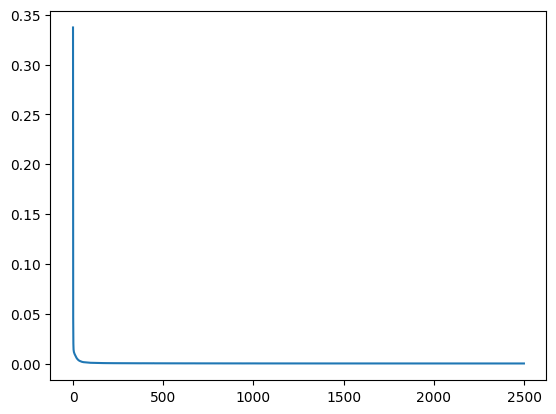

In [ ]:
plt.plot(loss_arr, label="loss")
# print(loss_arr[1500])
# print(loss_arr[2400])


In [ ]:
class CustomDataset2(Dataset):
    def __init__(self, file_path, x_size):
        df = pd.read_csv(file_path)
        #print(df.isnull().sum())

        self.I = df.iloc[x_size:, 6:7].values
        #self.x = np.reshape(x, (x.shape[0], 1, x.shape[1]))
        # self.y = df.iloc[x_size:, 13:14].values
        
        self.length = len(df) - x_size

    #getitem이거 왜씀?
    def __getitem__(self, index):
        # x = torch.FloatTensor([self.x[index]])
        # y = torch.FloatTensor([self.y[index]])
        # return x, y
        feature = torch.FloatTensor([self.x[index]])
        # label = torch.FloatTensor(self.y[index])

        return feature

    def __len__(self):
        return self.length

In [ ]:
def fx(x_esti, idx):
    # return A * x_esti + (dataset_d2.I[idx]*(1/44.72) / (1.648484097)) 
    return x_esti + (dataset_d2.I[idx]*100*(1.009217) / (1.600182 *3600/0.8)) #US -> 1.648484097 / DST -> 1.594214 / FUDS->1.600182  / BJDST->1.653517646
# US -> 1.007828486 / DST -> 1.00612 /  FUDS -> 1.009217  /  BJDST -> 1.001287

# @tf.function
def __d(K, n):
  return (math.factorial(K - 1 + n)) / (math.factorial(K - 1) * math.factorial(n))

# @tf.function
def PolynomialActivation(x):
  # x = x + 0.4
  N = 11
  K = 6
  zeta = 0.5 #y
  value = 0.5 #x
  dK = 0
  Sigmaz = 0
  for n in range(0, N - K):
    dK = dK + __d(K, n) * math.pow((1 - x), n)
  for n in range(0, N - K):
    Sigmaz = Sigmaz + __d(K, n) * math.pow((1 - zeta), n)
  CNK = (value * (zeta ** (-K)) - Sigmaz) / ((1 - zeta) ** (N - K))
  
  return np.where(x < 0., 0., 
                  np.where(x > 1., 1., 
                           math.pow(x, K) * (dK + (CNK * (math.pow((1 - x), (N - K)))))))
  

def SOC_fuzzy(SOC_tf, SOC_tf_prev, idx):
    # print(-1*PolynomialActivation(abs(SOC_tf - SOC_tf_prev)) + 1)
    # print(" ")
    # print(abs(SOC_tf - SOC_tf_prev))
    w1 = (-1*PolynomialActivation(abs(SOC_tf - SOC_tf_prev)) + 1)
    w2 = 1-w1

    return w1*(SOC_tf) + w2*(SOC_tf_prev)

torch.Size([11026])
(11095, 1)
44
(11095, 1)
torch.Size([11095])
mae :  1.5199134458444277
mse :  4.156790521684524
rmse :  2.0388208655211777


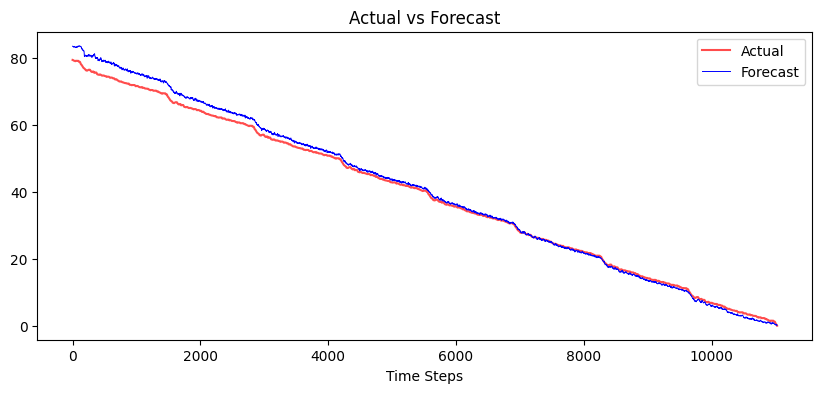

In [ ]:
eval_dataset = StrideDataset("FUDS_80.csv", 50, 20, 2586, stride=1)
# eval_dataset = StrideDataset("BJDST_80.csv", 50, 20, 1226, stride=1)
# eval_dataset = StrideDataset("DST_80.csv", 50, 20, 1919, stride=1)
# eval_dataset = StrideDataset("US06_80.csv", 50, 20, 1207, stride=1)
eval_dataloader = DataLoader(eval_dataset, batch_size=256, shuffle=False, drop_last=False)

# 
dataset_d = CustomDataset("FUDS_80.csv", 2586)
# dataset_d = CustomDataset("BJDST_80.csv", 1226)
# dataset_d = CustomDataset("DST_80.csv", 1919)
# dataset_d = CustomDataset("US06_80.csv", 1207)


predictions_zerosum = torch.zeros(69)
predictions_zerosum.shape
predictions_zerosum

model.eval()

predictions = torch.Tensor(0)
actual = torch.Tensor(0)
cnt=0

with torch.no_grad():
    for (inputs_v, inputs_c, dec_inputs, outputs) in eval_dataloader:
        src_mask_v = model.generate_square_subsequent_mask(inputs_v.shape[1]).to(device)
        src_mask_c = model.generate_square_subsequent_mask(inputs_c.shape[1]).to(device)
        tgt_mask = model.generate_square_subsequent_mask(dec_inputs.shape[1]).to(device)
        
        output = model(inputs_v.float().to(device), inputs_c.float().to(device), dec_inputs.float().to(device), src_mask_v, src_mask_c, tgt_mask)
        output = output.permute(1,0,2)
        
        cnt=cnt+1
        predictions = torch.cat((predictions, output[-1].view(-1).cpu()), 0) # view(-1) => 1차원으로 바꾼다 생각
        actual = torch.cat((actual, outputs[-1].view(-1).cpu()), 0)


print(predictions.shape)
print(dataset_d.y.shape)
print(cnt)

predictions = torch.concat((predictions_zerosum, predictions),0)

predictions = predictions * 80.0

plt.figure(figsize=(10,4))
plt.plot(dataset_d.y[69:], color='red', alpha=0.7)
plt.plot(predictions[69:], color='blue', linewidth=0.7)
plt.title('Actual vs Forecast')
plt.legend(['Actual', 'Forecast'])
plt.xlabel('Time Steps')
# plt.xlim([2800,3000])
# plt.ylim([56.5,60.5])


from sklearn.metrics import mean_absolute_error, mean_squared_error

print(dataset_d.y.shape)
print(predictions.shape)

print("mae : ", mean_absolute_error(dataset_d.y[69:10000], predictions[69:10000]))
print("mse : ", mean_squared_error(dataset_d.y[69:10000], predictions[69:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[69:10000], predictions[69:10000])))




In [ ]:
def error_define(x, y):

    error = x-y
    return error




mae :  1.519833482807996
mse :  4.156503789079473
rmse :  2.0387505460647883


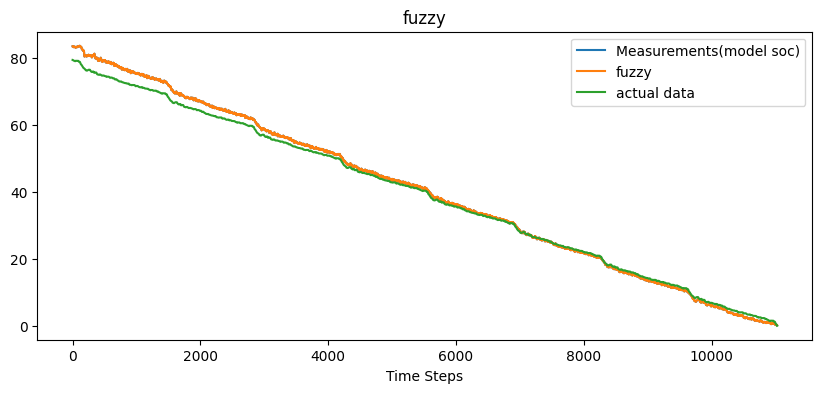

In [ ]:
n_samples = 11095
# n_samples = 10639

soc_meas_save = np.zeros(n_samples)
soc_esti_save = np.zeros(n_samples)
test = np.zeros(n_samples)

dataset_d2 = CustomDataset2("FUDS_80.csv", 2586)
# dataset_d2 = CustomDataset2("DST_80.csv", 1919)

for i in range(n_samples):
    z_meas = np.array(predictions[i])
    if i<1:
        z_meas_prev = 80
    else:
        z_meas_prev = np.array(predictions[i-1])
    
    # if i == 0:
    #     x_esti = w1*z_meas + w2*80
    # else:
    #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

    x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

    soc_meas_save[i] = z_meas
    soc_esti_save[i] = x_esti
# for i in range(n_samples):
#     z_meas = np.array(predictions[i])
#     if i<1:
#         z_meas_prev = 80
#     else:
#         z_meas_prev = fx(z_meas_prev, i)
    
#     # if i == 0:
#     #     x_esti = w1*z_meas + w2*80
#     # else:
#     #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

#     x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti
#     test[i] = z_meas_prev
    
plt.figure(figsize=(10,4))

plt.plot(soc_meas_save[70:], label='Measurements(model soc)')
plt.plot(soc_esti_save[70:], label='fuzzy')
plt.plot(dataset_d.y[70:], label='actual data')
plt.legend(loc='upper right')
plt.title('fuzzy')
plt.xlabel('Time Steps')



print("mae : ", mean_absolute_error(dataset_d.y[70:10000], soc_esti_save[70:10000]))
print("mse : ", mean_squared_error(dataset_d.y[70:10000], soc_esti_save[70:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[70:10000], soc_esti_save[70:10000])))

mae :  0.13756199174611974
mse :  0.03093029698989272
rmse :  0.1758701139758905


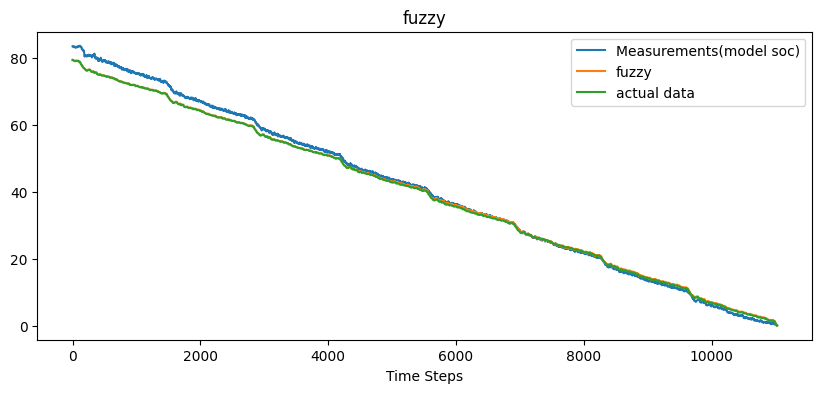

In [ ]:
n_samples = 11095
# n_samples = 10639

soc_meas_save = np.zeros(n_samples)
soc_esti_save = np.zeros(n_samples)
test = np.zeros(n_samples)

dataset_d2 = CustomDataset2("FUDS_80.csv", 2586)
# dataset_d2 = CustomDataset2("DST_80.csv", 1919)


# for i in range(n_samples):
#     z_meas = np.array(predictions[i])
#     if i<1:
#         z_meas_prev = 80
#     else:
#         z_meas_prev = np.array(predictions[i-1])
    
#     # if i == 0:
#     #     x_esti = w1*z_meas + w2*80
#     # else:
#     #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

#     x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti
for i in range(n_samples):
    z_meas = np.array(predictions[i])
    if i<1:
        z_meas_prev = 80
    else:
        z_meas_prev = fx(z_meas_prev, i)
    
    # if i == 0:
    #     x_esti = w1*z_meas + w2*80
    # else:
    #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

    x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

    soc_meas_save[i] = z_meas
    soc_esti_save[i] = x_esti
    test[i] = z_meas_prev
    
plt.figure(figsize=(10,4))

plt.plot(soc_meas_save[69:], label='Measurements(model soc)')
plt.plot(soc_esti_save[69:], label='fuzzy')
plt.plot(dataset_d.y[69:], label='actual data')
plt.legend(loc='upper right')
plt.title('fuzzy')
plt.xlabel('Time Steps')



print("mae : ", mean_absolute_error(dataset_d.y[69:10000], soc_esti_save[69:10000]))
print("mse : ", mean_squared_error(dataset_d.y[69:10000], soc_esti_save[69:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[69:10000], soc_esti_save[69:10000])))


Text(0.5, 0, 'Time Steps')

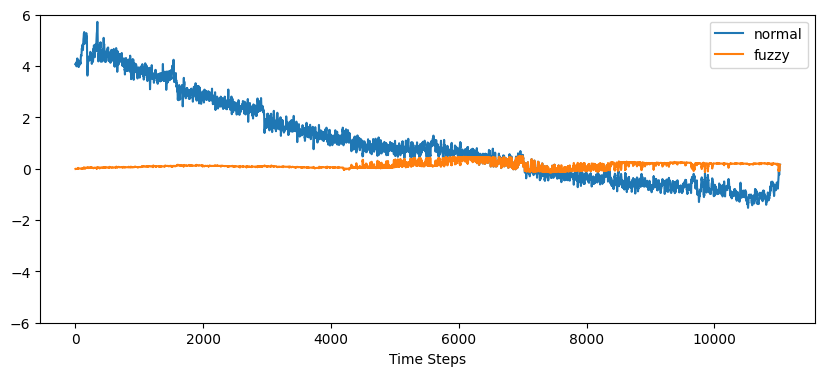

In [ ]:
error_normal = np.zeros(11026)
error_fuzzy = np.zeros(11026)

for i in range(11026):
    error_nor = error_define(predictions[i+69], dataset_d.y[i+69])
    error_fuz = error_define(soc_esti_save[i+69], dataset_d.y[i+69])
    
    error_normal[i] = error_nor
    error_fuzzy[i] = error_fuz

plt.figure(figsize=(10,4))
plt.plot(error_normal)
plt.plot(error_fuzzy)
plt.ylim(-6,6)
# plt.title('Actual vs Forecast')
plt.legend(['normal', 'fuzzy'])
plt.xlabel('Time Steps')

In [ ]:
def fx(x_esti, idx):
    # return A * x_esti + (dataset_d2.I[idx]*(1/44.72) / (1.648484097)) 
    return x_esti + (dataset_d2.I[idx]*100*(1.001287) / (1.653517646 *3600/0.8)) #US -> 1.648484097 / DST -> 1.594214 / FUDS->1.600182  / BJDST->1.653517646
# US -> 1.007828486 / DST -> 1.00612 /  FUDS -> 1.009217  /  BJDST -> 1.001287

torch.Size([11142])
(11211, 1)
44
(11211, 1)
torch.Size([11211])
mae :  2.965225560025484
mse :  13.562679708630846
rmse :  3.6827543644167804


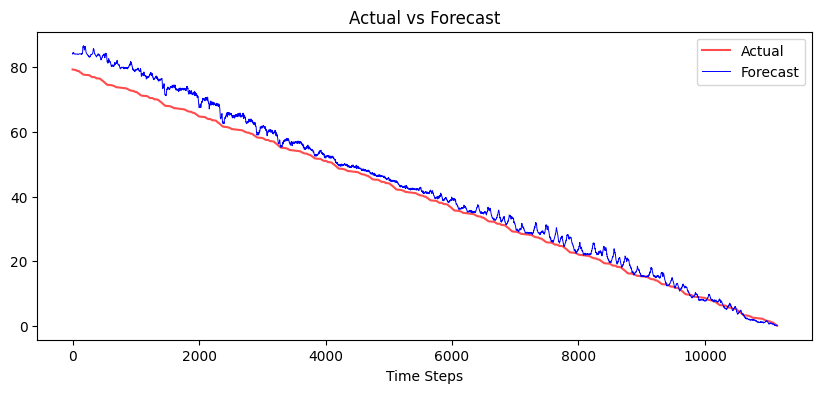

In [ ]:
# eval_dataset = StrideDataset("FUDS_80.csv", 50, 20, 2586, stride=1)
eval_dataset = StrideDataset("BJDST_80.csv", 50, 20, 1226, stride=1)
# eval_dataset = StrideDataset("DST_80.csv", 50, 20, 1919, stride=1)
# eval_dataset = StrideDataset("US06_80.csv", 50, 20, 1207, stride=1)
eval_dataloader = DataLoader(eval_dataset, batch_size=256, shuffle=False, drop_last=False)

# 
# dataset_d = CustomDataset("FUDS_80.csv", 2586)
dataset_d = CustomDataset("BJDST_80.csv", 1226)
# dataset_d = CustomDataset("DST_80.csv", 1919)
# dataset_d = CustomDataset("US06_80.csv", 1207)


predictions_zerosum = torch.zeros(69)
predictions_zerosum.shape
predictions_zerosum

model.eval()

predictions = torch.Tensor(0)
actual = torch.Tensor(0)
cnt=0

with torch.no_grad():
    for (inputs_v, inputs_c, dec_inputs, outputs) in eval_dataloader:
        src_mask_v = model.generate_square_subsequent_mask(inputs_v.shape[1]).to(device)
        src_mask_c = model.generate_square_subsequent_mask(inputs_c.shape[1]).to(device)
        tgt_mask = model.generate_square_subsequent_mask(dec_inputs.shape[1]).to(device)
        
        output = model(inputs_v.float().to(device), inputs_c.float().to(device), dec_inputs.float().to(device), src_mask_v, src_mask_v, tgt_mask)
        output = output.permute(1,0,2)
        
        cnt=cnt+1
        predictions = torch.cat((predictions, output[-1].view(-1).cpu()), 0) # view(-1) => 1차원으로 바꾼다 생각
        actual = torch.cat((actual, outputs[-1].view(-1).cpu()), 0)


print(predictions.shape)
print(dataset_d.y.shape)
print(cnt)

predictions = torch.concat((predictions_zerosum, predictions),0)

predictions = predictions * 80.0

plt.figure(figsize=(10,4))
plt.plot(dataset_d.y[69:], color='red', alpha=0.7)
plt.plot(predictions[69:], color='blue', linewidth=0.7)
plt.title('Actual vs Forecast')
plt.legend(['Actual', 'Forecast'])
plt.xlabel('Time Steps')
# plt.xlim([2800,3000])
# plt.ylim([56.5,60.5])


from sklearn.metrics import mean_absolute_error, mean_squared_error

print(dataset_d.y.shape)
print(predictions.shape)

print("mae : ", mean_absolute_error(dataset_d.y[69:10000], predictions[69:10000]))
print("mse : ", mean_squared_error(dataset_d.y[69:10000], predictions[69:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[69:10000], predictions[69:10000])))




In [ ]:
# n_samples = 11211
# # n_samples = 10690

# soc_meas_save = np.zeros(n_samples)
# soc_esti_save = np.zeros(n_samples)
# test = np.zeros(n_samples)

# dataset_d2 = CustomDataset2("BJDST_80.csv", 1226)
# # dataset_d2 = CustomDataset2("US06_80.csv", 1207)

# for i in range(n_samples):
#     z_meas = np.array(predictions[i])
#     if i<1:
#         z_meas_prev = 80
#     else:
#         z_meas_prev = np.array(predictions[i-1])
    
#     # if i == 0:
#     #     x_esti = w1*z_meas + w2*80
#     # else:
#     #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

#     x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti
# # for i in range(n_samples):
# #     z_meas = np.array(predictions[i])
# #     if i<1:
# #         z_meas_prev = 80
# #     else:
# #         z_meas_prev = fx(z_meas_prev, i)
    
# #     # if i == 0:
# #     #     x_esti = w1*z_meas + w2*80
# #     # else:
# #     #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

# #     x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

# #     soc_meas_save[i] = z_meas
# #     soc_esti_save[i] = x_esti
# #     test[i] = z_meas_prev
    
# plt.figure(figsize=(10,4))

# plt.plot(soc_meas_save[70:], label='Measurements(model soc)')
# plt.plot(soc_esti_save[70:], label='fuzzy')
# plt.plot(dataset_d.y[70:], label='actual data')
# plt.legend(loc='upper right')
# plt.title('fuzzy')
# plt.xlabel('Time Steps')



# print("mae : ", mean_absolute_error(dataset_d.y[70:10000], soc_esti_save[70:10000]))
# print("mse : ", mean_squared_error(dataset_d.y[70:10000], soc_esti_save[70:10000]))
# print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[70:10000], soc_esti_save[70:10000])))

mae :  0.07309194442272766
mse :  0.011089967538652303
rmse :  0.10530891481091381


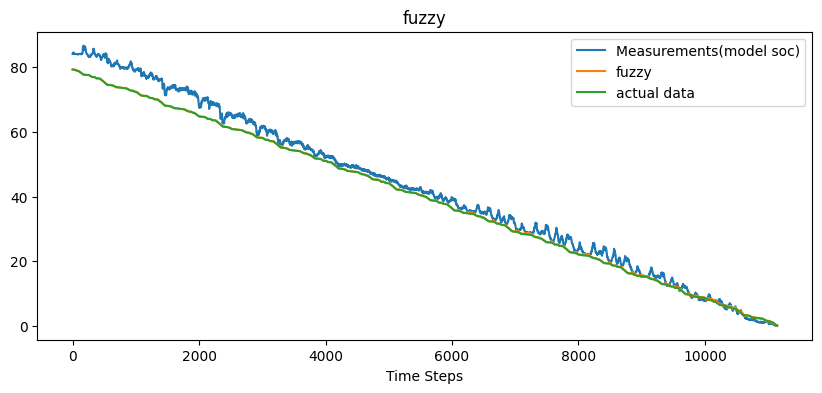

In [ ]:
n_samples = 11211
# n_samples = 10690

soc_meas_save = np.zeros(n_samples)
soc_esti_save = np.zeros(n_samples)
test = np.zeros(n_samples)

dataset_d2 = CustomDataset2("BJDST_80.csv", 1226)
# dataset_d2 = CustomDataset2("US06_80.csv", 1207)

# for i in range(n_samples):
#     z_meas = np.array(predictions[i])
#     if i<1:
#         z_meas_prev = 80
#     else:
#         z_meas_prev = np.array(predictions[i-1])
    
#     # if i == 0:
#     #     x_esti = w1*z_meas + w2*80
#     # else:
#     #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

#     x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti

for i in range(n_samples):
    z_meas = np.array(predictions[i])
    if i<1:
        z_meas_prev = 80
    else:
        z_meas_prev = fx(z_meas_prev, i)
    
    # if i == 0:
    #     x_esti = w1*z_meas + w2*80
    # else:
    #     x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)

    x_esti = SOC_fuzzy(z_meas, z_meas_prev, i)

    soc_meas_save[i] = z_meas
    soc_esti_save[i] = x_esti
    test[i] = z_meas_prev
    
plt.figure(figsize=(10,4))

plt.plot(soc_meas_save[69:], label='Measurements(model soc)')
plt.plot(soc_esti_save[69:], label='fuzzy')
plt.plot(dataset_d.y[69:], label='actual data')
plt.legend(loc='upper right')
plt.title('fuzzy')
plt.xlabel('Time Steps')



print("mae : ", mean_absolute_error(dataset_d.y[69:10000], soc_esti_save[69:10000]))
print("mse : ", mean_squared_error(dataset_d.y[69:10000], soc_esti_save[69:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[69:10000], soc_esti_save[69:10000])))


Text(0.5, 0, 'Time Steps')

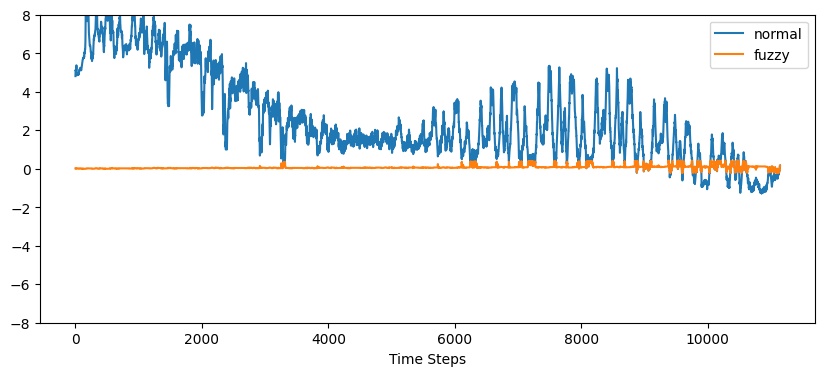

In [ ]:
error_normal = np.zeros(11142)
error_fuzzy = np.zeros(11142)

for i in range(11142):
    error_nor = error_define(predictions[i+69], dataset_d.y[i+69])
    error_fuz = error_define(soc_esti_save[i+69], dataset_d.y[i+69])
    
    error_normal[i] = error_nor
    error_fuzzy[i] = error_fuz

plt.figure(figsize=(10,4))
plt.plot(error_normal)
plt.plot(error_fuzzy)
plt.ylim(-8,8)
# plt.title('Actual vs Forecast')
plt.legend(['normal', 'fuzzy'])
plt.xlabel('Time Steps')

In [ ]:
n_samples = 10690

soc_meas_save = np.zeros(n_samples)
soc_esti_save = np.zeros(n_samples)

In [ ]:
class CustomDataset2(Dataset):
    def __init__(self, file_path, x_size):
        df = pd.read_csv(file_path)
        #print(df.isnull().sum())

        self.I = df.iloc[x_size:, 6:7].values
        #self.x = np.reshape(x, (x.shape[0], 1, x.shape[1]))
        # self.y = df.iloc[x_size:, 13:14].values
        
        self.length = len(df) - x_size

    #getitem이거 왜씀?
    def __getitem__(self, index):
        # x = torch.FloatTensor([self.x[index]])
        # y = torch.FloatTensor([self.y[index]])
        # return x, y
        feature = torch.FloatTensor([self.x[index]])
        # label = torch.FloatTensor(self.y[index])

        return feature

    def __len__(self):
        return self.length

In [ ]:
# dataset_d2 = CustomDataset2("FUDS_80.csv", 2586)
dataset_d2 = CustomDataset2("BJDST_80.csv", 1226)
# dataset_d2 = CustomDataset2("DST_80.csv", 1919)
# dataset_d2 = CustomDataset2("US06_80.csv", 1207)

In [ ]:
def fx(x_esti, idx):
    # return A * x_esti + (dataset_d2.I[idx]*(1/44.72) / (1.648484097)) 
    return x_esti + (dataset_d2.I[idx]*100*(1.007922) / (1.648484097 *3600/0.8)) #US -> 1.648484097 / DST -> 1.594214 / FUDS->1.600182  / BJDST->1.653517646

In [ ]:
# x_esti, P = None, None
# for i in range(n_samples):
#     z_meas = np.array(predictions[i])
#     if i == 0:
#         x_esti, P = x_0, P_0
#     else:
#         x_esti, P = unscented_kalman_filter(z_meas, x_esti, P, i)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti

In [ ]:
w1, w2 = 0.2, 0.8
for i in range(n_samples):
    z_meas = np.array(predictions[i])
    
    if i == 0:
        x_esti = w1*z_meas + w2*80
    else:
        x_esti = w1*z_meas + w2*fx(dataset_d.y[i-1],i)
        
    if i<3000:
        w1 = w1+0.0001
        w2 = w2-0.0001
        
    

    soc_meas_save[i] = z_meas
    soc_esti_save[i] = x_esti

print(w1)
print(w2)

0.49999999999996697
0.5000000000000331


In [ ]:
# for i in range(n_samples):

#     if i == 0:
#         x_esti = 80
#     else:
#         x_esti = fx(dataset_d.y[i-1],i)

#     soc_esti_save[i] = x_esti

mae :  1.2066896732869874
mse :  1.9414013727504211
rmse :  1.3933418004030529


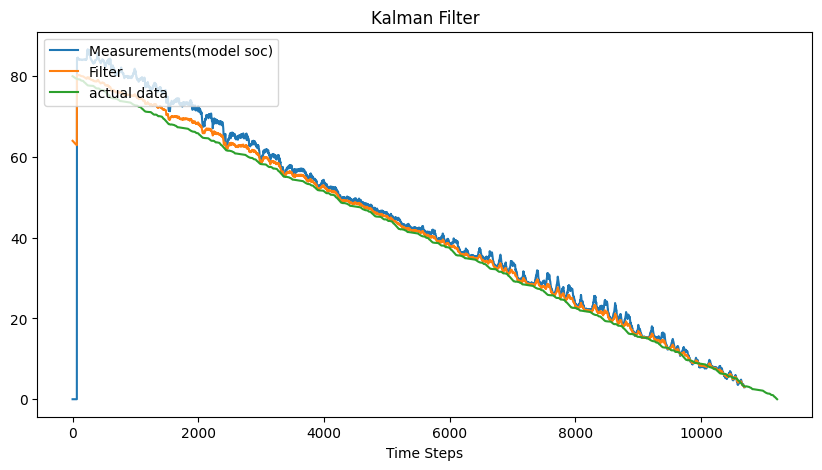

In [ ]:
plt.figure(figsize=(10,5))

plt.plot(soc_meas_save, label='Measurements(model soc)')
plt.plot(soc_esti_save, label='Filter')
plt.plot(dataset_d.y, label='actual data')
plt.legend(loc='upper left')
plt.title('Kalman Filter')
plt.xlabel('Time Steps')



# plt.xlim(7500, 8500)
# plt.ylim(15, 24)

print("mae : ", mean_absolute_error(dataset_d.y[69:10000], soc_esti_save[69:10000]))
print("mse : ", mean_squared_error(dataset_d.y[69:10000], soc_esti_save[69:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[69:10000], soc_esti_save[69:10000])))

In [ ]:
n = len(predictions)
k = np.arange(n)
Fs = 1/0.0001
T = n/Fs
freq = k/T
freq = freq[range(int(n/2))]

In [ ]:
Y1 = np.fft.fft(predictions)/n
Y1 = Y1[range(int(n/2))]
Y2 = np.fft.fft(dataset_d.y)/n
Y2 = Y2[range(int(n/2))]

Y3 = abs(Y2)/abs(Y1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(0.0, 20.0)

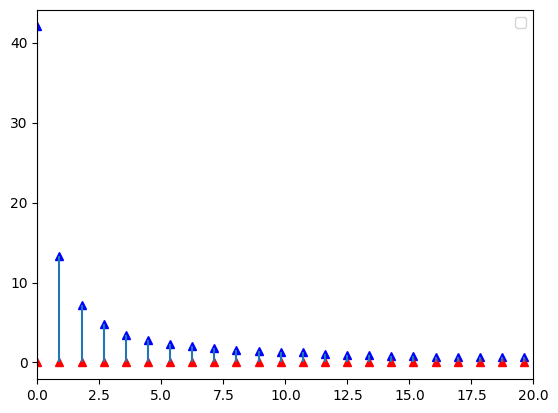

In [ ]:
plt.plot(freq, abs(Y1), 'b', linestyle=' ', marker='^')
plt.plot(freq, abs(Y2), 'r', linestyle=' ', marker='^')
plt.legend()
plt.vlines(freq, [0],abs(Y1))
plt.vlines(freq, [0],abs(Y2))
plt.xlim([0, 20])
# plt.plot(abs(Y))

In [ ]:
Y2

array([[0.00713545+0.j],
       [0.00713532+0.j],
       [0.00713519+0.j],
       ...,
       [0.0035945 +0.j],
       [0.00359369+0.j],
       [0.00359289+0.j]])

(0.0, 100.0)

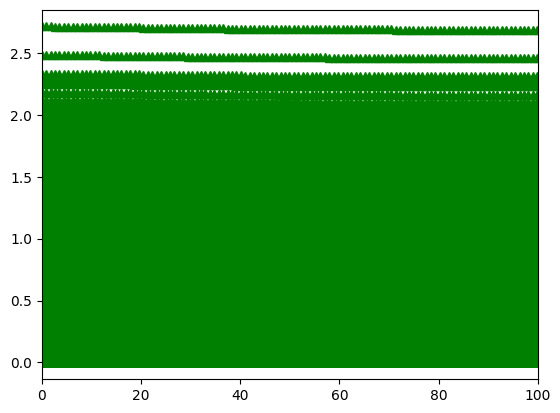

In [ ]:
plt.plot(freq, abs(Y3), 'g', linestyle=' ', marker='^')
# plt.vlines(freq, [0],abs(Y3))
plt.xlim([0, 100])


In [ ]:
class CustomDataset2(Dataset):
    def __init__(self, file_path, x_size):
        df = pd.read_csv(file_path)
        #print(df.isnull().sum())

        self.I = df.iloc[x_size:, 6:7].values
        #self.x = np.reshape(x, (x.shape[0], 1, x.shape[1]))
        # self.y = df.iloc[x_size:, 13:14].values
        
        self.length = len(df) - x_size

    #getitem이거 왜씀?
    def __getitem__(self, index):
        # x = torch.FloatTensor([self.x[index]])
        # y = torch.FloatTensor([self.y[index]])
        # return x, y
        feature = torch.FloatTensor([self.x[index]])
        # label = torch.FloatTensor(self.y[index])

        return feature

    def __len__(self):
        return self.length

In [ ]:
# A = 1

# dataset_d2 = CustomDataset2("US06_80.csv", 1207)

# dataset_d2.I

# # test = np.zeros(10690)

# # test = dataset_d2.I// 1.648484097

# # plt.plot(test)

# def fx(x_esti, idx):
#     # return A * x_esti + (dataset_d2.I[idx]*(1/44.72) / (1.648484097)) 
#     return x_esti + (dataset_d2.I[idx]*100*(1.007922) / (1.648484097*3600/0.8)) 



# soc_func = np.zeros(10690)

# x_esti = None
# for i in range(10690):
#     if i == 0:
#         x_esti = 80
#     else:
#         x_esti = fx(x_esti, i)
        
#     soc_func[i] = x_esti
    


In [ ]:
# soc_func[10680:10690]

In [ ]:
# plt.figure(figsize=(10,10))
# plt.plot(soc_func, label='Measurements(model soc)')
# plt.plot(dataset_d.y, color='red', alpha=0.7)
# plt.legend(['Actual', 'coulomb counting'])

# # # plt.xlim(0,200)
# # plt.ylim(0,100)

In [ ]:
# from sklearn.metrics import mean_absolute_error 

# print(dataset_d.y.shape)
# print(predictions.shape)

# mean_absolute_error(dataset_d.y[:10000], soc_func[:10000])

칼만필터 적용 (전류적산 / 모델 예측)

In [ ]:
# def kalman_filter(z_meas, x_esti, P):
#     """Kalman Filter Algorithm for One Variable."""
#     # (1) Prediction.
#     x_pred = A * x_esti
#     P_pred = A * P * A + Q

#     # (2) Kalman Gain.
#     K = P_pred * H / (H * P_pred * H + R)

#     # (3) Estimation.
#     x_esti = x_pred + K * (z_meas - H * x_pred)

#     # (4) Error Covariance.
#     P = P_pred - K * H * P_pred

#     return x_esti, P

In [ ]:
# # Initialization for system model.
# A = 1
# H = 1
# Q = 0.00000005
# R = 0.00001
# # Initialization for estimation.
# x_0 = 80
# P_0 = 10

In [ ]:
# n_samples = 10621

# soc_meas_save = np.zeros(n_samples)
# soc_esti_save = np.zeros(n_samples)

In [ ]:
# x_esti, P = None, None
# for i in range(n_samples):
#     z_meas = predictions[i]
#     if i == 0:
#         x_esti, P = x_0, P_0
#     else:
#         x_esti, P = kalman_filter(z_meas, x_esti, P)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti

In [ ]:
# plt.plot(soc_meas_save, label='Measurements(model soc)')
# plt.plot(soc_esti_save, label='Kalman Filter')
# plt.plot(dataset_d.y, label='actual data')
# plt.legend(loc='upper left')
# plt.title('Kalman Filter')
# plt.xlabel('Time Steps')

# plt.xlim(5200, 5400)
# plt.ylim(39, 41)

In [ ]:
# mean_absolute_error(dataset_d.y[:10000], soc_esti_save[:10000])

확장칼만필터

In [ ]:
# class CustomDataset2(Dataset):
#     def __init__(self, file_path, x_size):
#         df = pd.read_csv(file_path)
#         #print(df.isnull().sum())

#         self.I = df.iloc[x_size:, 6:7].values
#         #self.x = np.reshape(x, (x.shape[0], 1, x.shape[1]))
#         # self.y = df.iloc[x_size:, 13:14].values
        
#         self.length = len(df) - x_size

#     #getitem이거 왜씀?
#     def __getitem__(self, index):
#         # x = torch.FloatTensor([self.x[index]])
#         # y = torch.FloatTensor([self.y[index]])
#         # return x, y
#         feature = torch.FloatTensor([self.x[index]])
#         # label = torch.FloatTensor(self.y[index])

#         return feature

#     def __len__(self):
#         return self.length

In [ ]:
# dataset_d2 = CustomDataset2("US06_80.csv", 1207)

# dataset_d2.I

In [ ]:
# def Ajacob_at(x_esti):
#     return A


# def Hjacob_at(x_pred):
#     return H


# def fx(x_esti, idx):
#     # return A * x_esti + (dataset_d2.I[idx]*(1/44.72) / (1.648484097)) 
#     return x_esti + (dataset_d2.I[idx]*100*(1.007922) / (1.648484097*3600/0.8)) 


# def hx(x_pred):
#     return x_pred


# def extended_kalman_filter(z_meas, x_esti, P):
#     """Extended Kalman Filter Algorithm."""
#     # (1) Prediction.
#     A = Ajacob_at(x_esti)
#     x_pred = fx(x_esti)
#     P_pred = A @ P @ A.T + Q

#     # (2) Kalman Gain.
#     H = Hjacob_at(x_pred)
#     K = P_pred @ H.T @ inv(H @ P_pred @ H.T + R)

#     # (3) Estimation.
#     x_esti = x_pred + K @ (z_meas - hx(x_pred))

#     # (4) Error Covariance.
#     P = P_pred - K @ H @ P_pred

#     return x_esti, P

In [ ]:
# # Initialization for system model.
# A = 1
# H = 1
# Q = 0.00000001
# R = 0.000001



# # Initialization for estimation.
# x_0 = 80
# P_0 = 10

In [ ]:
# n_samples = 10621

# soc_meas_save = np.zeros(n_samples)
# soc_esti_save = np.zeros(n_samples)

In [ ]:
# x_esti, P = None, None
# for i in range(n_samples):
#     z_meas = predictions[i]
#     if i == 0:
#         x_esti, P = x_0, P_0
#     else:
#         x_esti, P = kalman_filter(z_meas, x_esti, P)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti

In [ ]:
# plt.plot(soc_meas_save, label='Measurements(model soc)')
# plt.plot(soc_esti_save, label='Kalman Filter')
# plt.plot(dataset_d.y, label='actual data')
# plt.legend(loc='upper left')
# plt.title('Kalman Filter')
# plt.xlabel('Time Steps')

# plt.xlim(3000, 4000)
# plt.ylim(50, 58)

In [ ]:
# mean_absolute_error(dataset_d.y[:10000], soc_esti_save[:10000])

무향 칼만 필터(Unscented Kalman Filter)

In [ ]:
from numpy.linalg import inv, cholesky

In [ ]:
def sigma_points(mu, Sigma, kappa):
    n = 1
    Xi = np.zeros((n, 2*n+1))
    W = np.zeros(2*n+1)
    
    Xi[:, 0] = mu
    W[0] = kappa / (n + kappa)
    
    U = cholesky((n + kappa)*Sigma)
    
    for i in range(n):
        Xi[:, i+1]   = mu + U[:, i]
        Xi[:, n+i+1] = mu - U[:, i]
        W[i+1]       = 1 / (2*(n+kappa))
        W[n+i+1]     = W[i+1]
        
    return Xi, W

In [ ]:
def UT(Xi, W, noiseCov):
    mean = np.sum(W * Xi, axis=1)
    cov = W * (Xi - mean.reshape(-1, 1)) @ (Xi  - mean.reshape(-1, 1)).T
    return mean, cov + noiseCov

In [ ]:
# dataset_d2 = CustomDataset2("FUDS_80.csv", 2586)
dataset_d2 = CustomDataset2("BJDST_80.csv", 1226)
# dataset_d2 = CustomDataset2("DST_80.csv", 1919)

dataset_d2.I

array([[-0.11091334],
       [-0.11109395],
       [-0.83389229],
       ...,
       [-1.1113081 ],
       [-1.1113081 ],
       [-1.1114887 ]])

In [ ]:
def fx(x_esti, idx):
    # return A * x_esti + (dataset_d2.I[idx]*(1/44.72) / (1.648484097)) 
    return x_esti + (dataset_d2.I[idx]*100*(1.007922) / (1.653517646 *3600/0.8)) #US -> 1.648484097 / DST -> 1.594214 / FUDS->1.600182  / BJDST->1.653517646


def hx(x_pred):
    return x_pred

In [ ]:
def unscented_kalman_filter(z_meas, x_esti, P, idx):
    """Unscented Kalman Filter Algorithm."""
    # (1) Sample Sigma Points and Weights.
    Xi, W = sigma_points(x_esti, P, kappa)

    # (2) Predict Mean and Error Covariance of States.
    #fXi = fx(Xi) + (dataset_d.y[idx]-x_esti)
    fXi = fx(Xi, idx) 
    x_pred, P_x = UT(fXi, W, Q)

    # (3) Calculate Mean and Error Covariance for the Expected Observation.
    hXi = hx(fXi)
    z_pred, P_z = UT(hXi, W, R)

    # (4) Calculate Off Diagonal Elements of Error Covariance and Kalman Gain.
    Pxz = W * (fXi - x_pred.reshape(-1, 1)) @ (hXi - z_pred.reshape(-1, 1)).T
    K = Pxz @ inv(P_z)

    # (5) Estimate Mean and Error Covariance of States. 
    x_esti = x_pred + K @ (z_meas - z_pred)
    P = P_x - K @ P_z @ K.T

    return x_esti, P



In [ ]:
# Initialization for system model.
# Matrix: A, H, Q, R, P_0
# Vector: x_0
# A = np.eye(3) + dt * np.array([[0, 1, 0],
#                                [0, 0, 0],
#                                [0, 0, 0]])
A = 1
Q = (10**(-5)) * 1
R = (10**(-1)) * 5

# Initialization for estimation.
x_0 = 80
P_0 = 10 * np.eye(1) # p_0 = 10

# Initialization for sigma points.
kappa = 2

In [ ]:
n_samples = 10537

soc_meas_save = np.zeros(n_samples)
soc_esti_save = np.zeros(n_samples)

In [ ]:
x_esti, P = None, None
for i in range(n_samples):
    z_meas = np.array(predictions[i])
    if i == 0:
        x_esti, P = x_0, P_0
    else:
        x_esti, P = unscented_kalman_filter(z_meas, x_esti, P, i)

    soc_meas_save[i] = z_meas
    soc_esti_save[i] = x_esti

Text(0.5, 0, 'Time Steps')

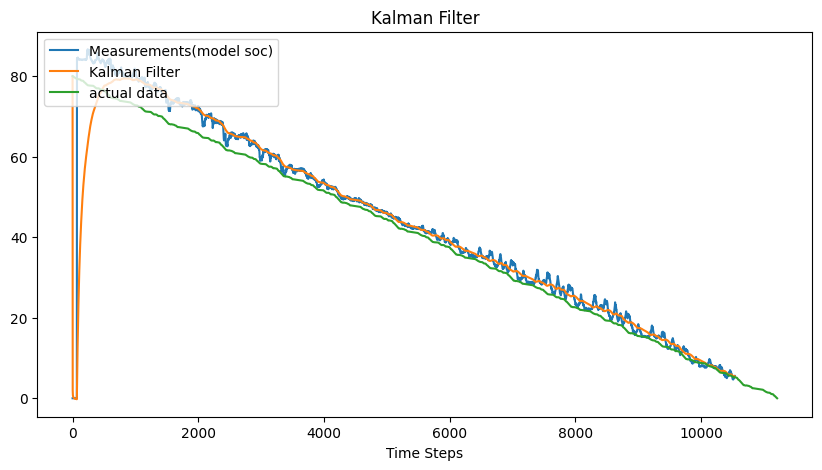

In [ ]:
plt.figure(figsize=(10,5))

plt.plot(soc_meas_save, label='Measurements(model soc)')
plt.plot(soc_esti_save, label='Kalman Filter')
plt.plot(dataset_d.y, label='actual data')
plt.legend(loc='upper left')
plt.title('Kalman Filter')
plt.xlabel('Time Steps')



# plt.xlim(7500, 8500)
# plt.ylim(15, 24)

In [ ]:
print("mae : ", mean_absolute_error(dataset_d.y[:10000], soc_esti_save[:10000]))
print("mse : ", mean_squared_error(dataset_d.y[:10000], soc_esti_save[:10000]))
print("rmse : ", np.sqrt(mean_squared_error(dataset_d.y[:10000], soc_esti_save[:10000])))

mae :  3.9248682379632576
mse :  79.93707715476705
rmse :  8.940753724086525


+

In [ ]:
# # Initialization for system model.
# A = 1
# H = 1
# Q = 0.00000001
# R = 0.00001



# # Initialization for estimation.
# x_0 = 80
# P_0 = 10

In [ ]:
# x_esti, P = None, None
# for i in range(n_samples):
#     z_meas = soc_esti_save[i]
#     if i == 0:
#         x_esti, P = x_0, P_0
#     else:
#         x_esti, P = kalman_filter(z_meas, x_esti, P)

#     soc_meas_save[i] = z_meas
#     soc_esti_save[i] = x_esti

In [ ]:
# plt.plot(soc_meas_save, label='Measurements(model soc)')
# plt.plot(soc_esti_save, label='Kalman Filter')
# plt.plot(dataset_d.y, label='actual data')
# plt.legend(loc='upper left')
# plt.title('Kalman Filter')
# plt.xlabel('Time Steps')


# plt.xlim(4000, 5000)
# plt.ylim(42, 50)

In [ ]:
# mean_absolute_error(dataset_d.y[:10000], soc_esti_save[:10000])